In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.cbook as cbook

In [2]:
tmpDf = pd.read_csv('../RawData/'+'[new] yancheng_train_20171226_2.csv')

c:\users\yw59785\python\python35\lib\site-packages\IPython\core\interactiveshell.py:2698: DtypeWarning: Columns (20) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [3]:
df = tmpDf[['sale_date', 'class_id', 'price', 'sale_quantity']]

In [4]:
# df.sort_values(by=['sale_date', 'class_id', 'sale_quantity'])

In [5]:
# df.sort_values(by=['class_id', 'sale_date', 'sale_quantity'])

In [6]:
resultDf = df.groupby(['class_id', 'sale_date']).sum()

In [7]:
# -*- coding:utf-8 -*-
from statsmodels.tsa.stattools import adfuller
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# 移动平均图
def draw_trend(timeSeries, size):
    f = plt.figure(facecolor='white')
    # 对size个数据进行移动平均
    rol_mean = timeSeries.rolling(window=size).mean()
    # 对size个数据进行加权移动平均
    rol_weighted_mean = pd.ewma(timeSeries, span=size)

    timeSeries.plot(color='blue', label='Original')
    rolmean.plot(color='red', label='Rolling Mean')
    rol_weighted_mean.plot(color='black', label='Weighted Rolling Mean')
    plt.legend(loc='best')
    plt.title('Rolling Mean')
    plt.show()

def draw_ts(timeSeries):
    f = plt.figure(facecolor='white')
    timeSeries.plot(color='blue')
    plt.show()

'''
　　Unit Root Test
   The null hypothesis of the Augmented Dickey-Fuller is that there is a unit
   root, with the alternative that there is no unit root. That is to say the
   bigger the p-value the more reason we assert that there is a unit root
'''
def testStationarity(ts):
    dftest = adfuller(ts)
    # 对上述函数求得的值进行语义描述
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    return dfoutput

# 自相关和偏相关图，默认阶数为31阶
def draw_acf_pacf(ts, lags=31):
    f = plt.figure(facecolor='white')
    ax1 = f.add_subplot(211)
    plot_acf(ts, lags=31, ax=ax1)
    ax2 = f.add_subplot(212)
    plot_pacf(ts, lags=31, ax=ax2)
    plt.show()

c:\users\yw59785\python\python35\lib\site-packages\statsmodels\compat\pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  from pandas.core import datetools


851857


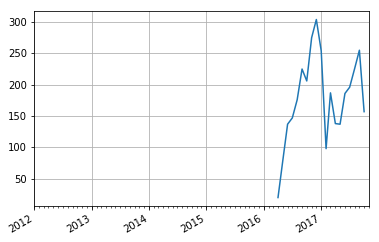

614059


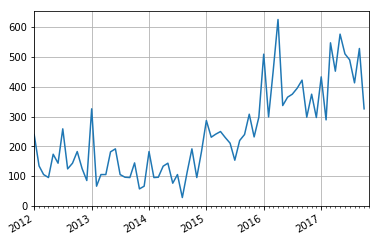

750340


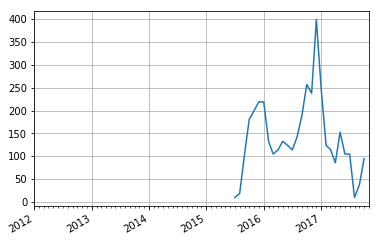

963845


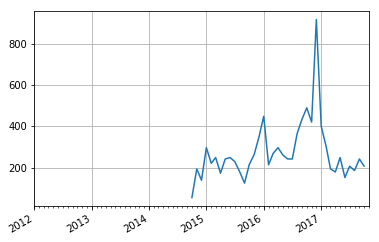

651782


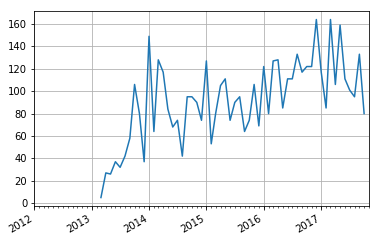

379265


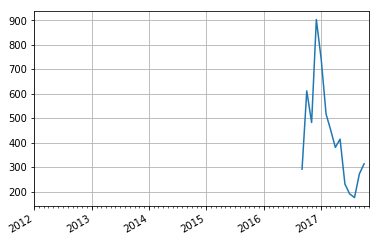

417803


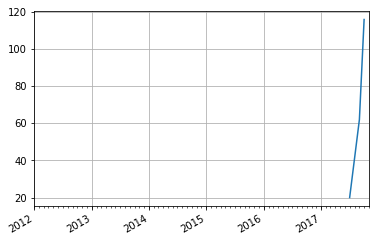

291086


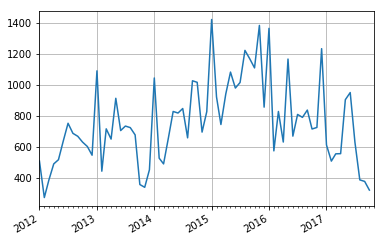

621073


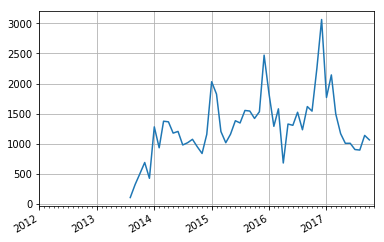

249875


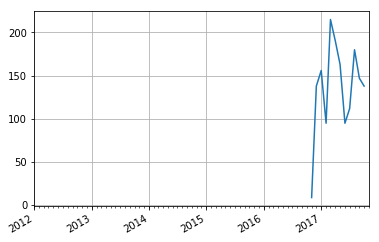

354068


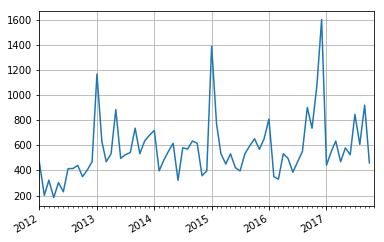

743957


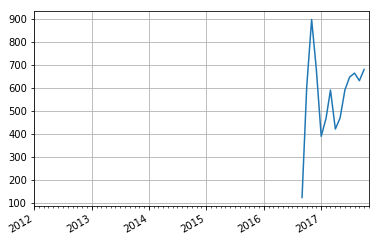

209945


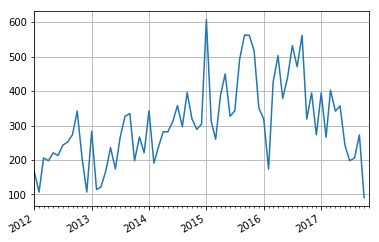

580634


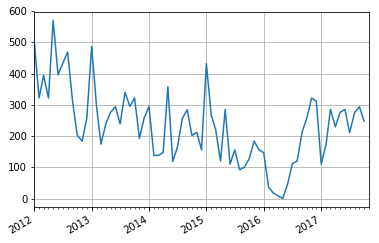

198427


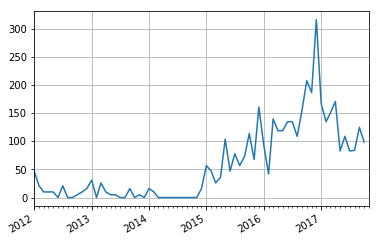

559132


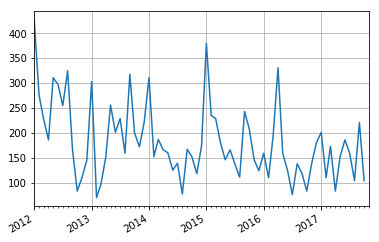

248352


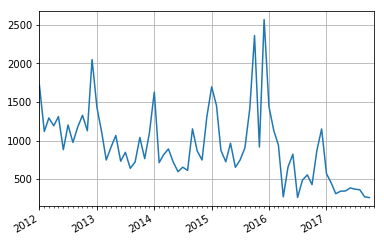

250658


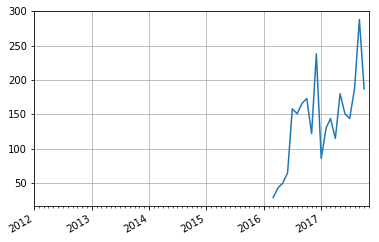

842246


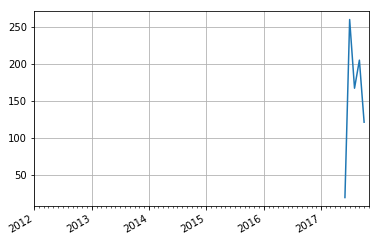

290854


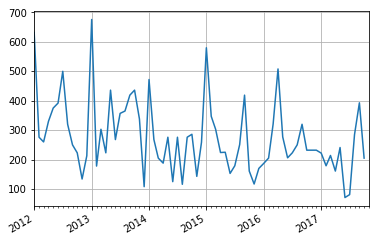

308913


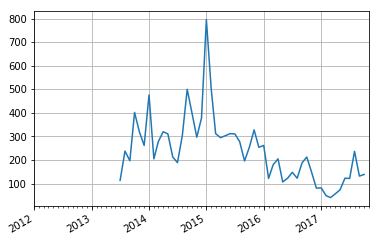

540712


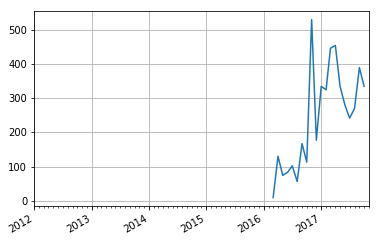

576298


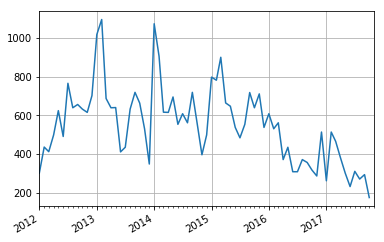

973106


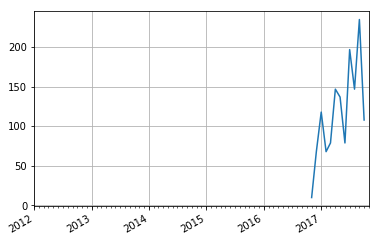

350259


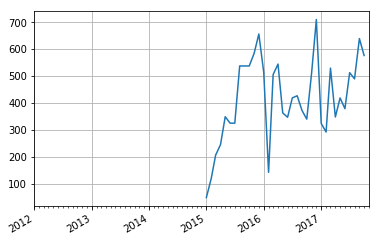

736094


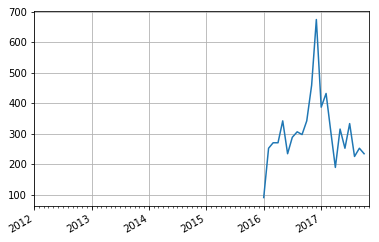

654134


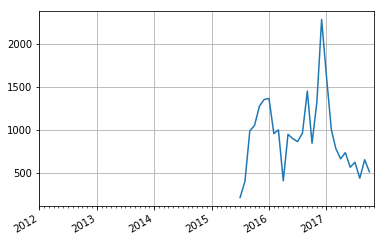

560265


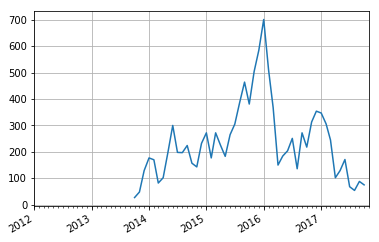

978089


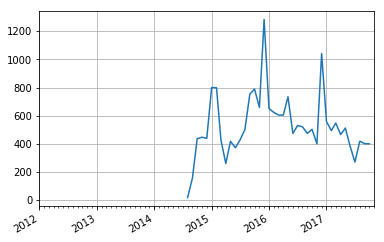

219195


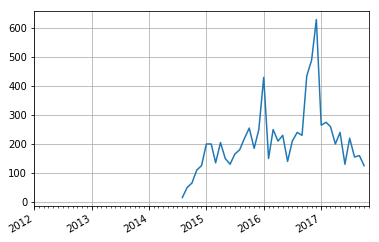

501564


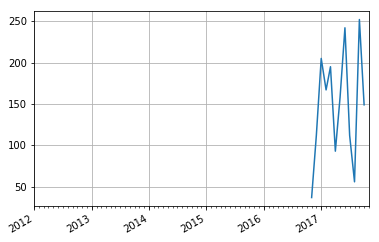

741152


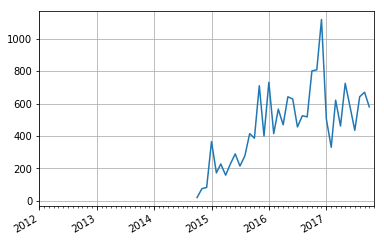

526401


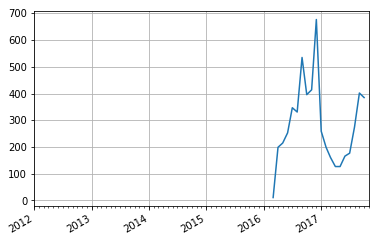

569154


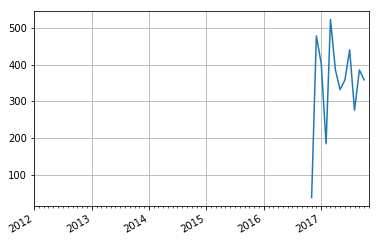

603972


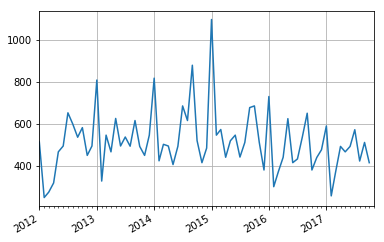

437063


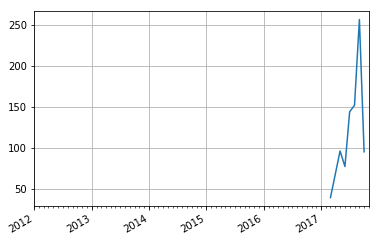

628041


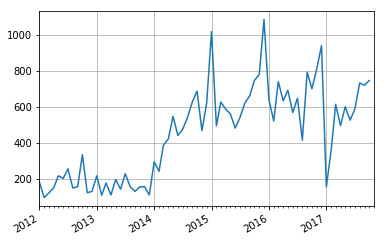

304458


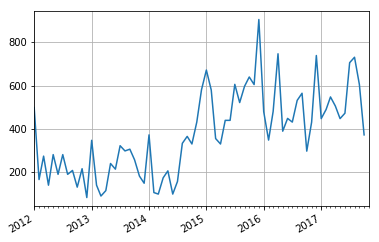

496459


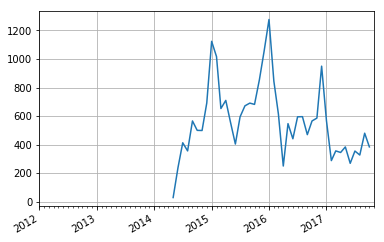

948936


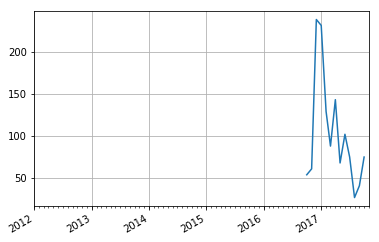

890189


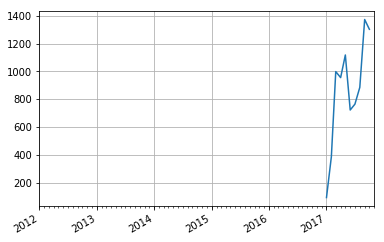

412240


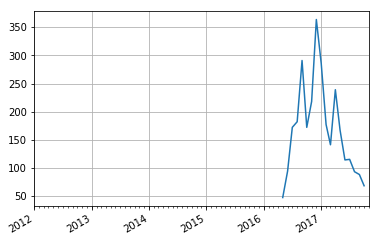

961362


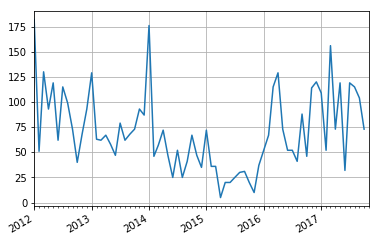

103507


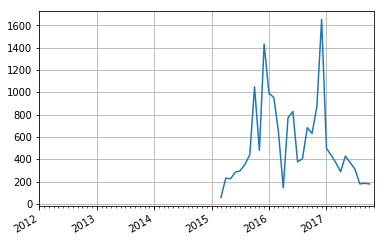

732758


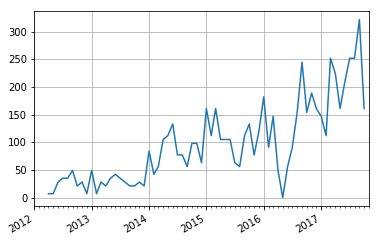

905061


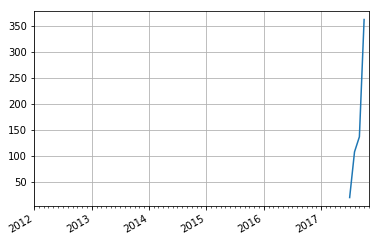

175962


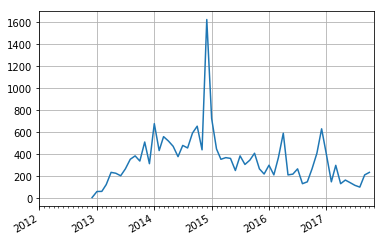

760412


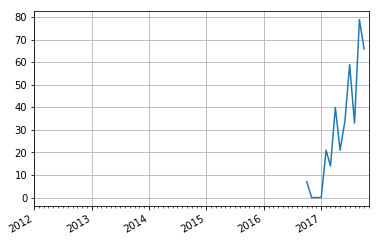

437598


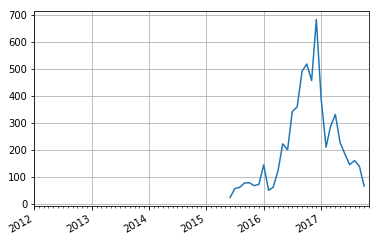

349023


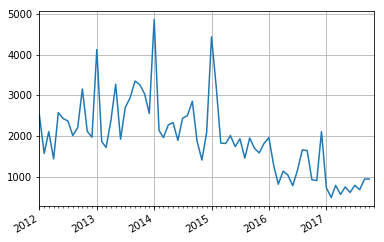

178529


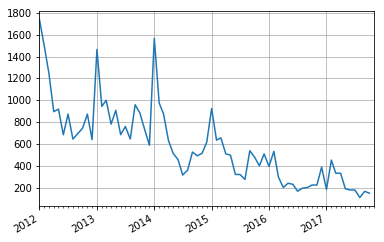

270690


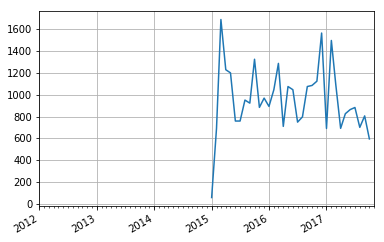

221795


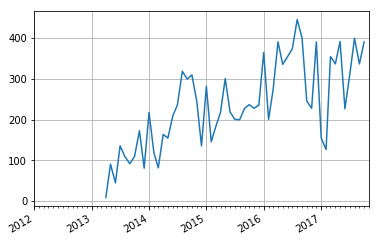

683364


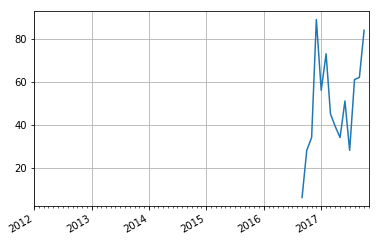

510309


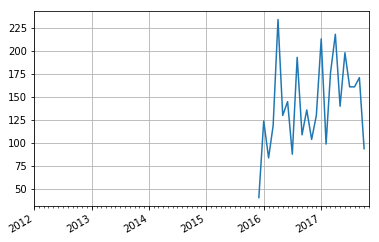

810398


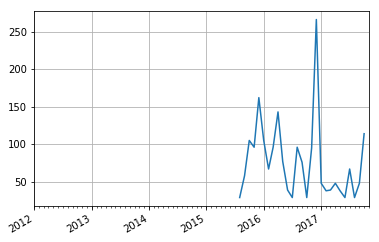

725137


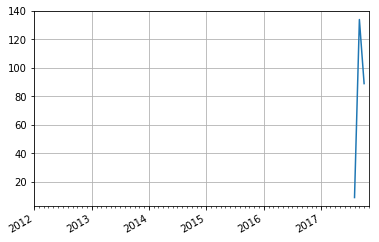

789290


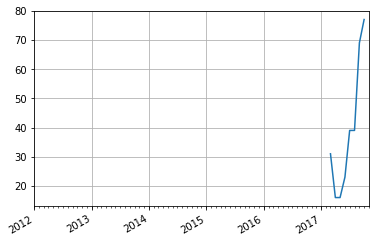

245609


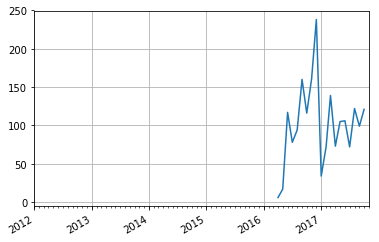

289386


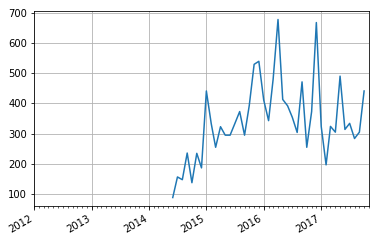

714860


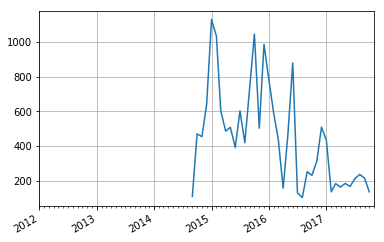

861459


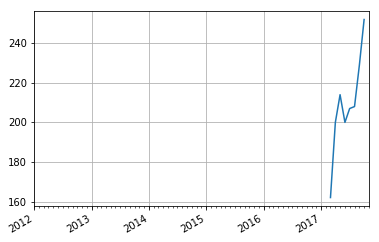

819061


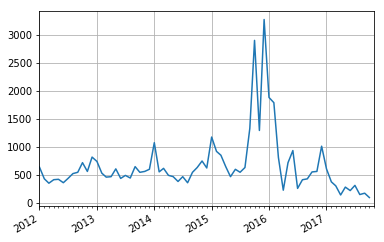

580470


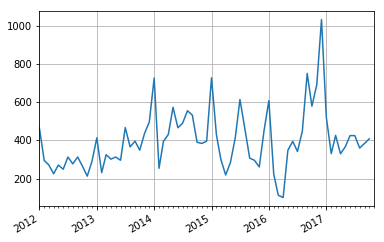

735971


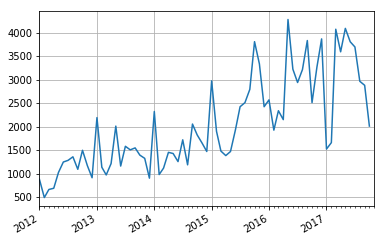

453752


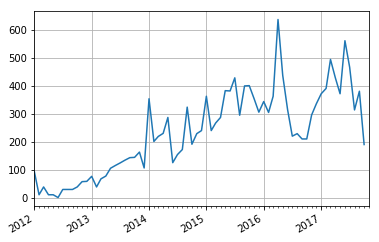

854548


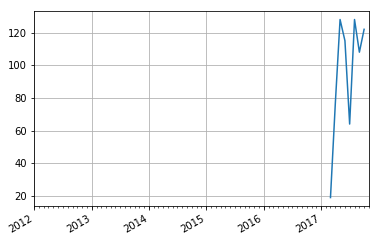

356986


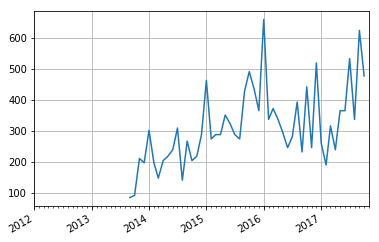

289403


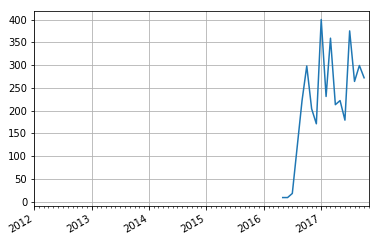

653436


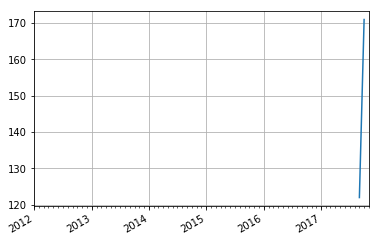

815230


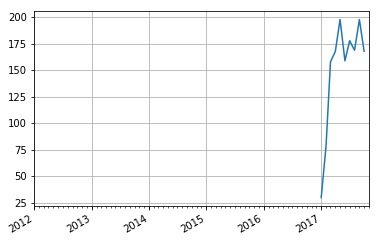

376193


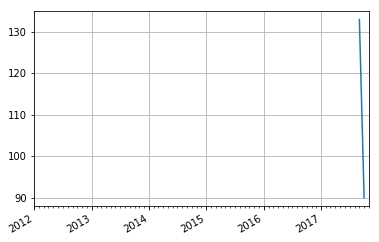

923841


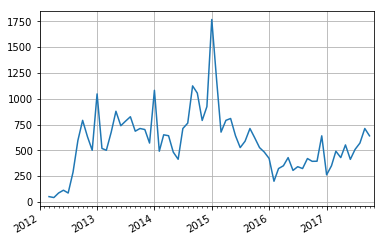

527809


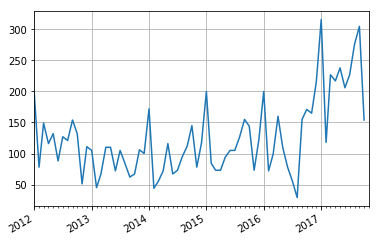

436105


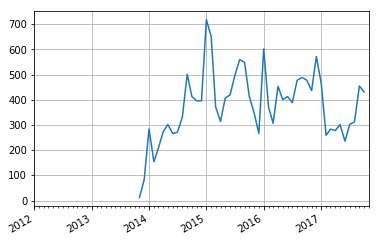

186250


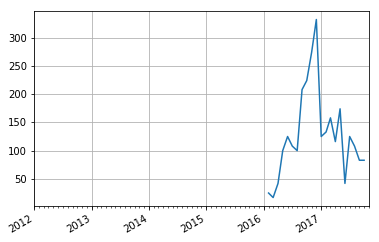

516750


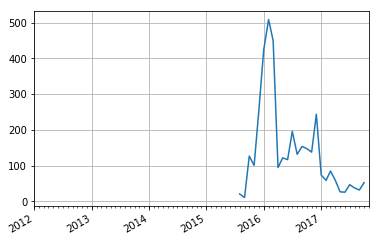

854079


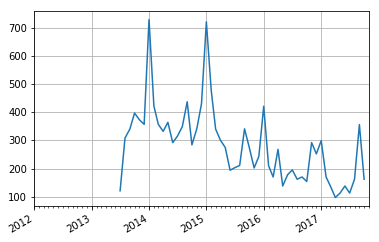

392593


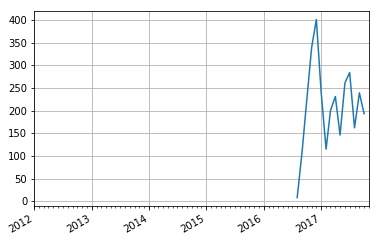

194450


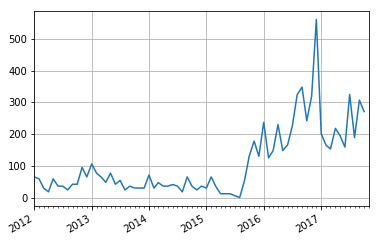

321683


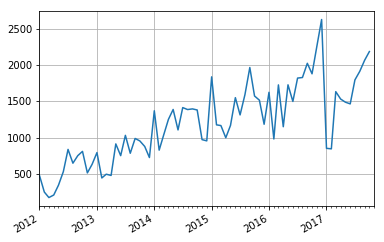

905745


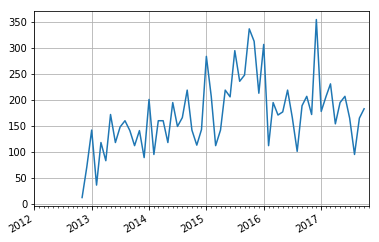

527765


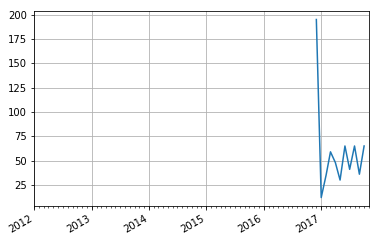

492952


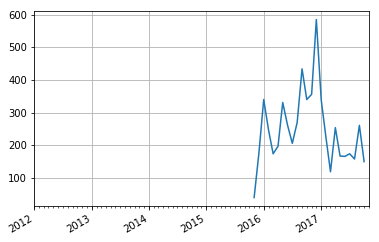

194201


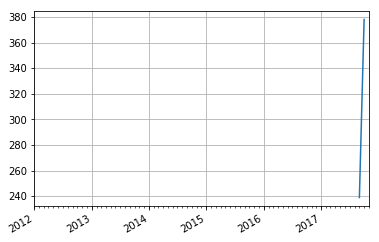

682651


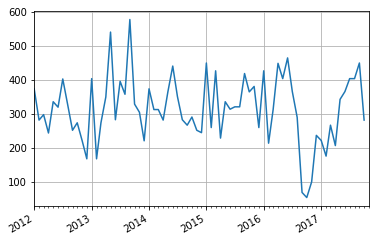

384924


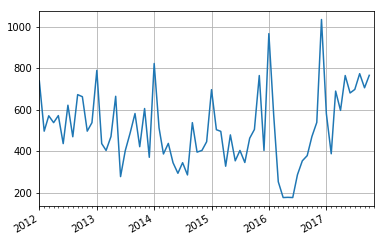

481950


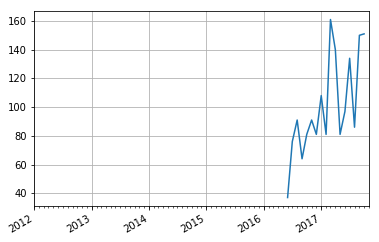

472603


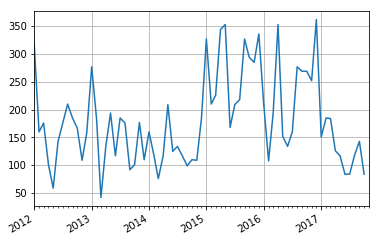

687270


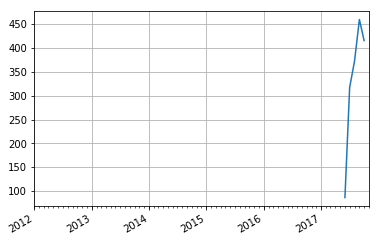

597927


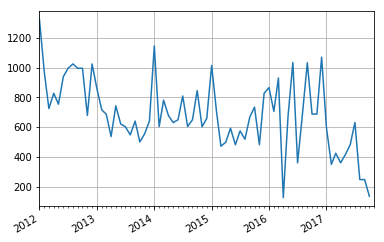

378536


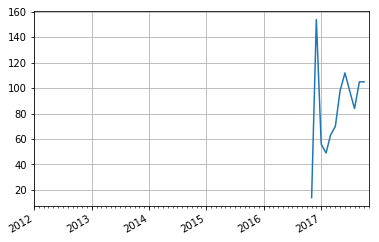

401052


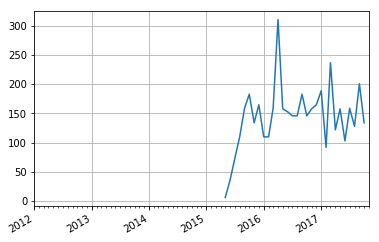

961962


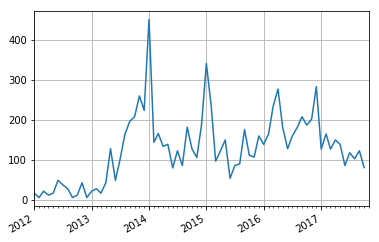

612523


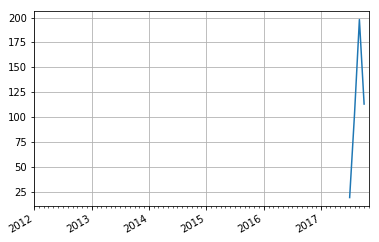

914348


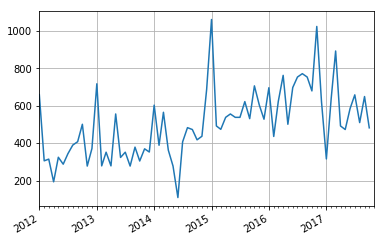

206765


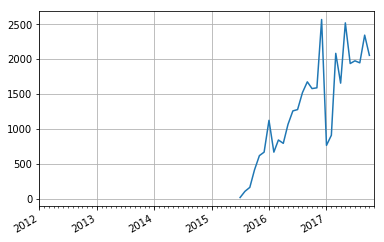

591790


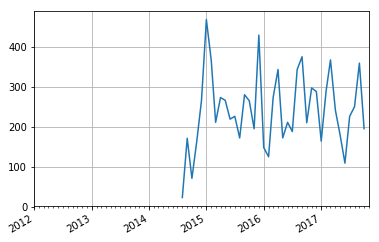

786351


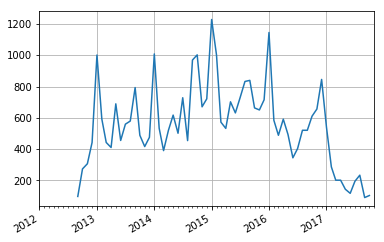

619401


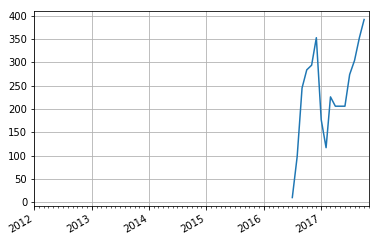

302513


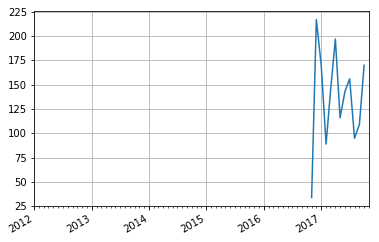

713651


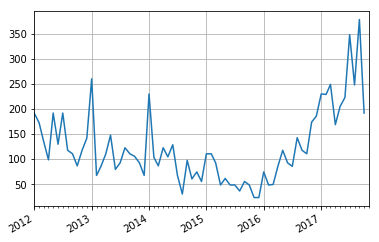

587678


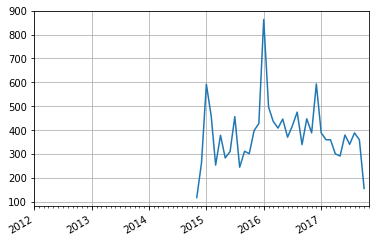

745137


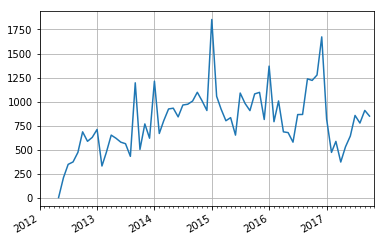

291514


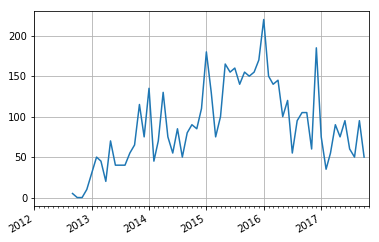

693436


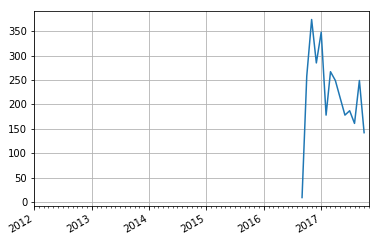

872180


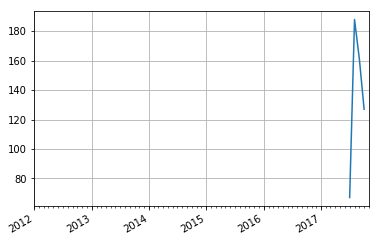

281792


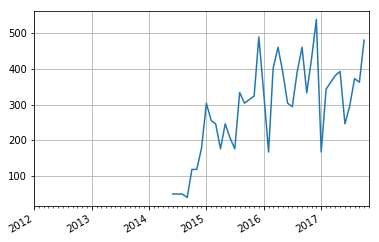

482497


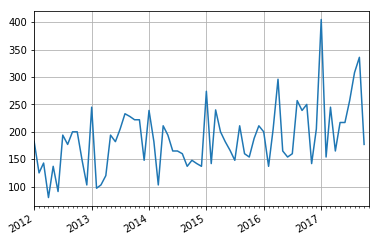

360648


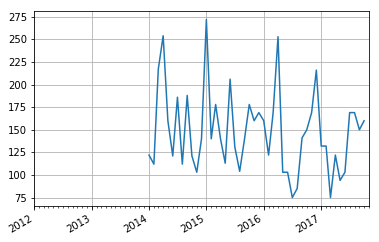

169673


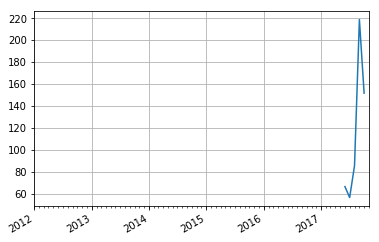

340175


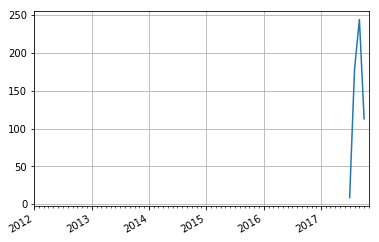

950264


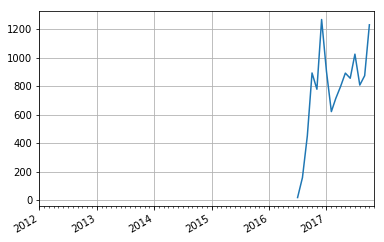

359378


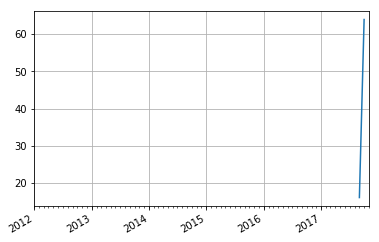

136916


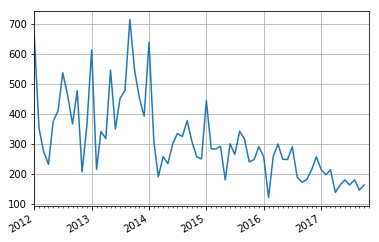

281301


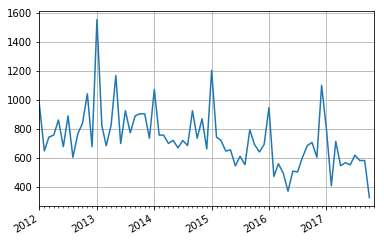

425432


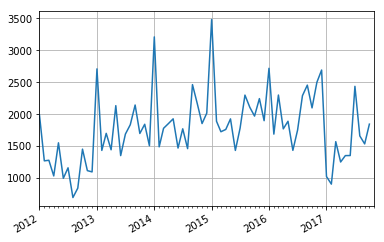

871642


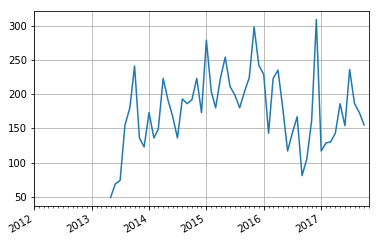

125403


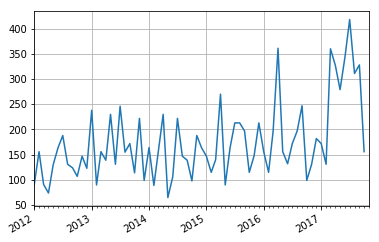

924154


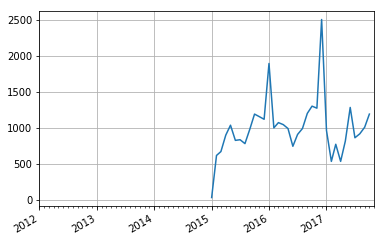

692703


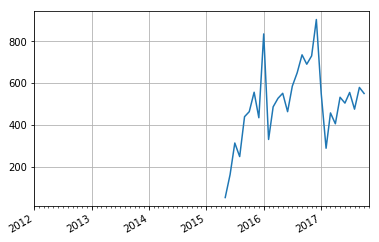

739296


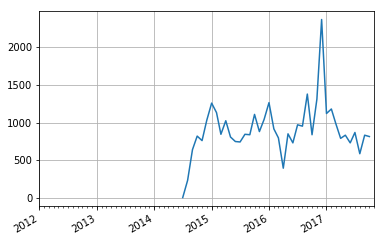

348641


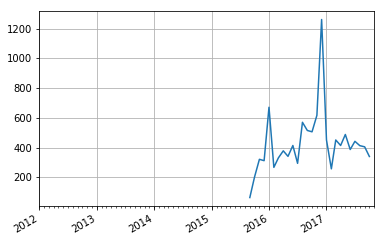

395234


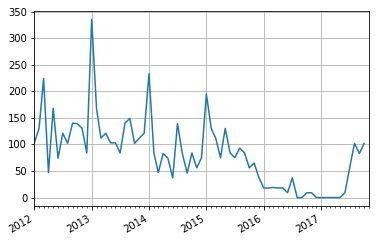

714152


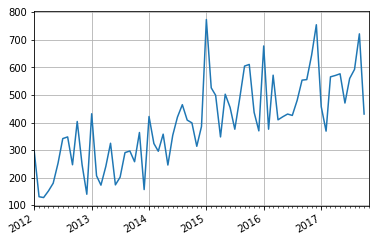

379876


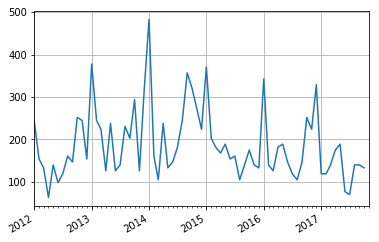

714150


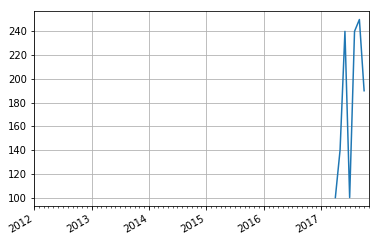

883691


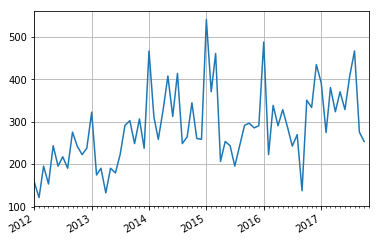

124140


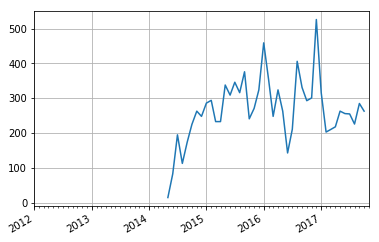

416749


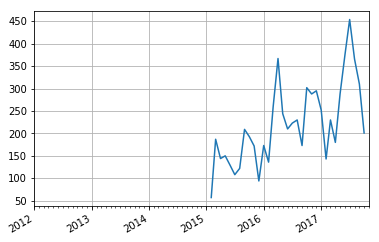

468392


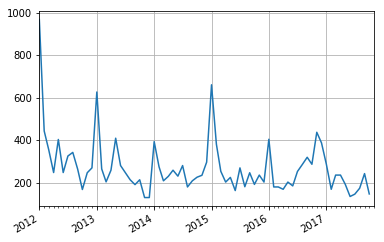

953842


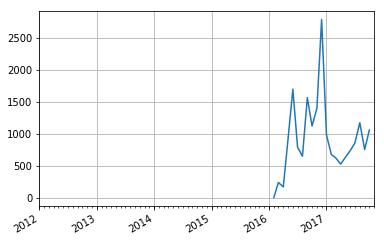

651347


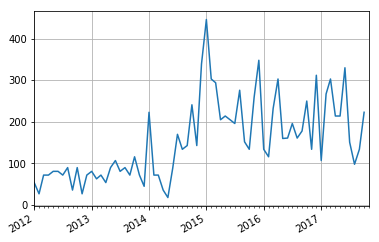

378356


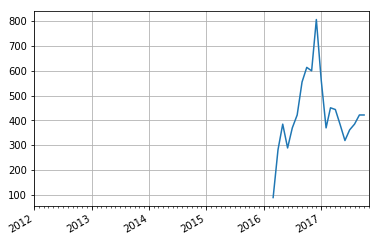

475895


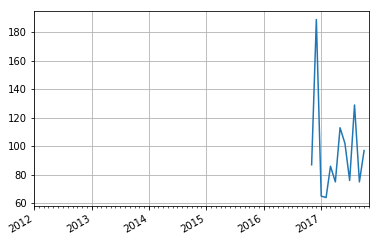

347384


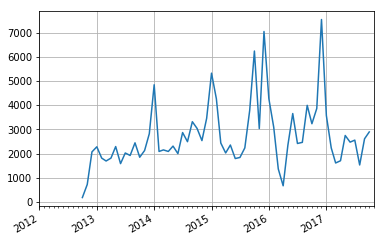

671482


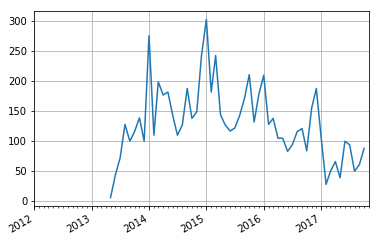

265980


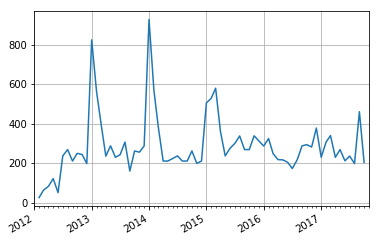

649213


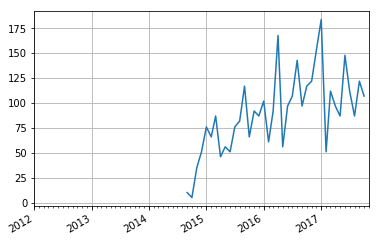

409854


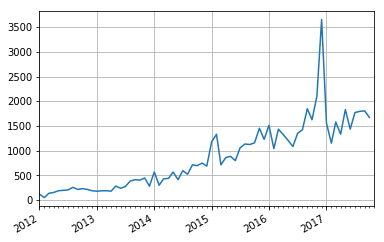

In [8]:
years = mdates.YearLocator()   # every year
months = mdates.MonthLocator()  # every month
yearsFmt = mdates.DateFormatter('%Y')

result = {}
for index, tmp in resultDf.iterrows():
    if index[0] in result:
        result[index[0]].append([index[1], tmp['sale_quantity']])
    else:
        result[index[0]] = [[index[1], tmp['sale_quantity']]]

for key, array in result.items():
    timeList = []
    for value in array:
        timeList.append(value[0])
    for index1 in range(2012, 2018):
        monthEnd = 13
        if index1 == 2017:
            monthEnd = 11
        for index2 in range(1, monthEnd):
            checkedTime = 0
            if index2 < 10:
                checkedTime = int(str(index1) + '0' + str(index2))
            else:
                checkedTime = int(str(index1) + str(index2))
            if checkedTime not in timeList and checkedTime > array[0][0]:
                array.append([checkedTime, 0])
                
def getKey(item):
    return item[0]

for key, value in result.items():
    xArray = []
    yArray = []
    value = sorted(value, key = getKey)
    print(key)
    for array in value:
        dateStr = str(array[0])
        date = pd.datetime(int(dateStr[0:4]), int(dateStr[4:6]), 1)
        sale_quantity = array[1]
        xArray.append(date)
        yArray.append(sale_quantity)
    fig, ax = plt.subplots()
    ax.plot(np.array(xArray), np.array(yArray))
    # format the ticks
    ax.xaxis.set_major_locator(years)
    ax.xaxis.set_major_formatter(yearsFmt)
    ax.xaxis.set_minor_locator(months)

    datemin = pd.datetime(2012, 1, 1)
    datemax = pd.datetime(2017, 11, 1)
    ax.set_xlim(datemin, datemax)

    ax.format_xdata = mdates.DateFormatter('%Y-%m')
#     ax.format_ydata = price
    ax.grid(True)

    # rotates and right aligns the x labels, and moves the bottom of the
    # axes up to make room for them
    fig.autofmt_xdate()

    plt.show()

In [9]:
testDf = pd.read_csv('../RawData/'+'yancheng_testA_20171225.csv')
for i in testDf['class_id'].unique():
    if i not in result:
        print('not in result: ', i)

In [10]:
sorted_result = sorted(result.items(), key=lambda x:x[1][1])

In [11]:

_tmp = [(value[0], len(value[1]))for value in sorted_result]
l = list(zip(*_tmp))
pd.DataFrame(data={'classid': l[0], 'trainlen': l[1]}).to_csv('trainlen.csv', index=False)

In [12]:
__df = pd.DataFrame(data=[[value[0], len(value[1])]for value in sorted_result])

CLASS:  961962


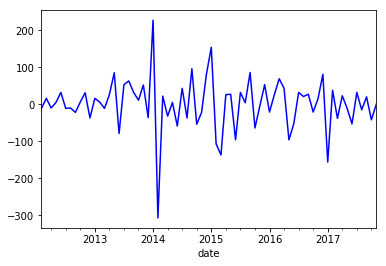

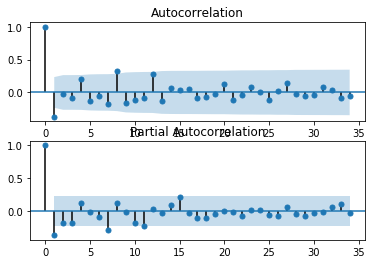

pvalue:  2.31155412968e-22


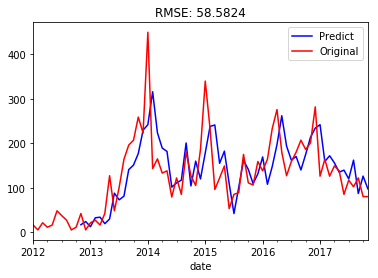

CLASS:  453752


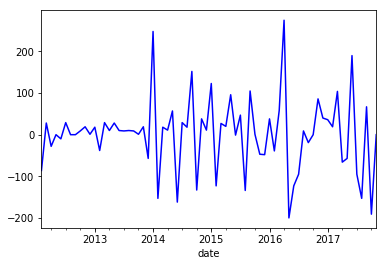

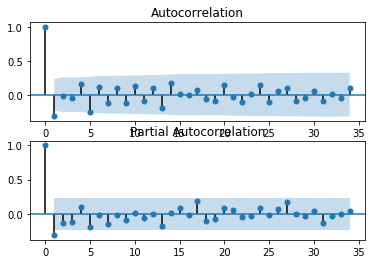

pvalue:  5.9733203301e-21


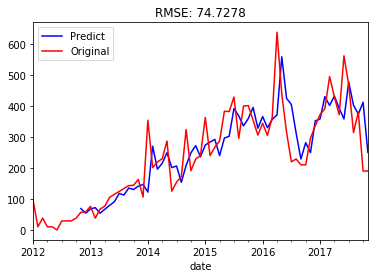

CLASS:  198427


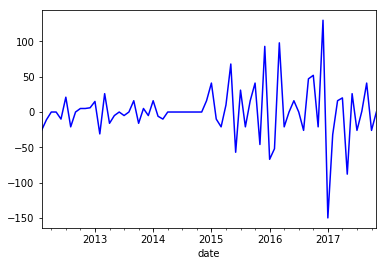

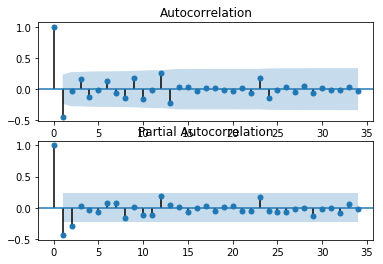

pvalue:  1.01893311595e-15


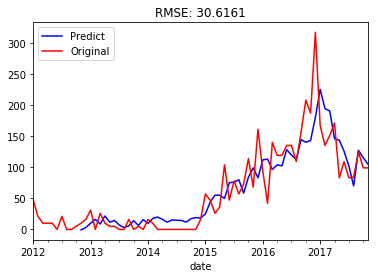

CLASS:  651347


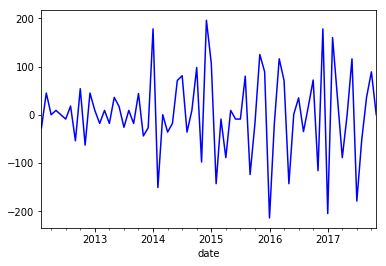

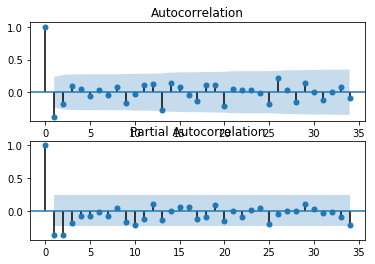

pvalue:  6.84604608746e-11


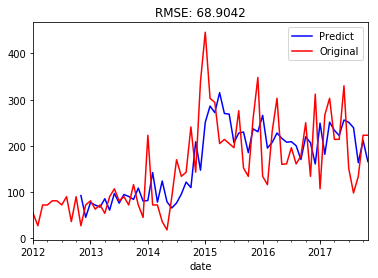

CLASS:  961362


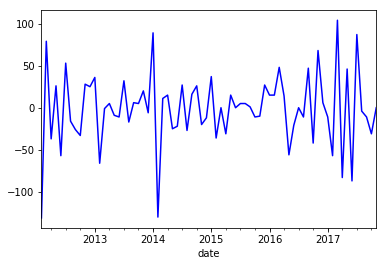

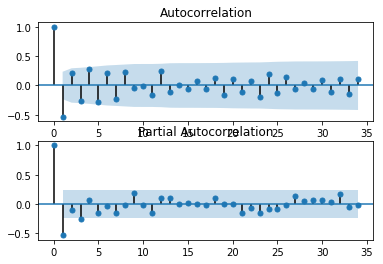

pvalue:  2.7530116495e-11


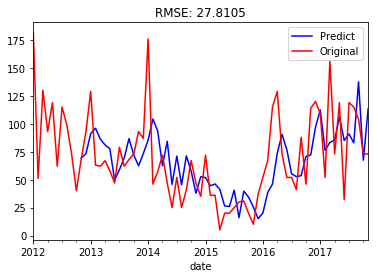

CLASS:  409854


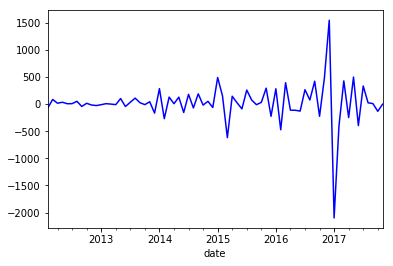

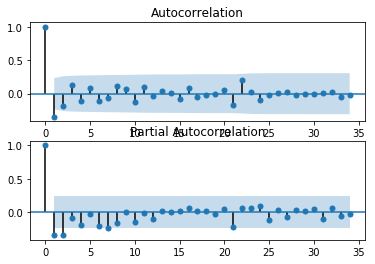

pvalue:  3.22245472343e-16


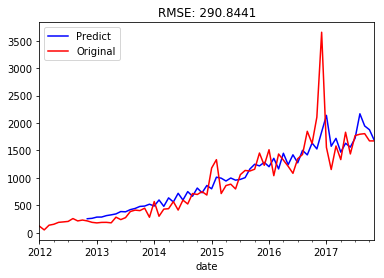

CLASS:  194450


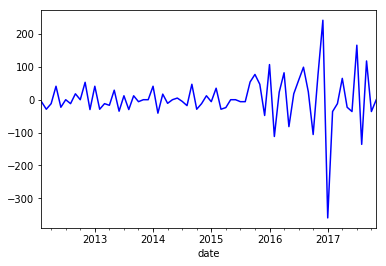

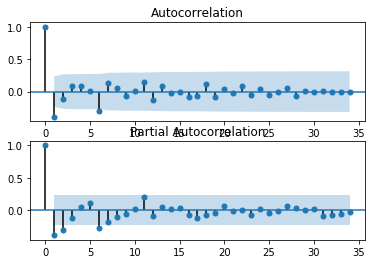

pvalue:  0.566026786398


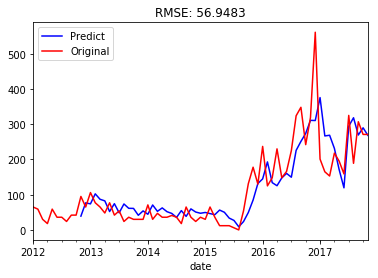

CLASS:  527809


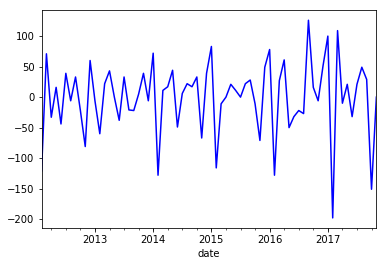

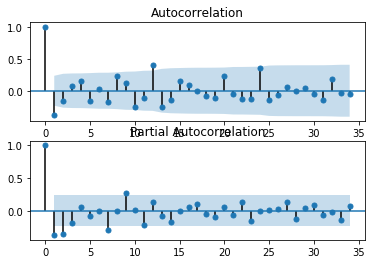

pvalue:  0.115912913784


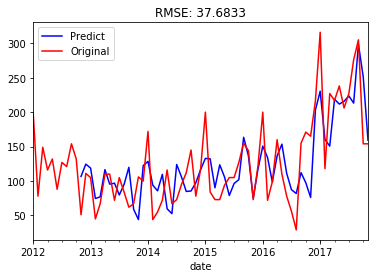

CLASS:  628041


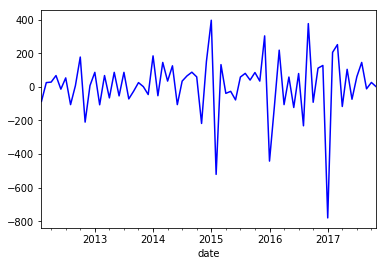

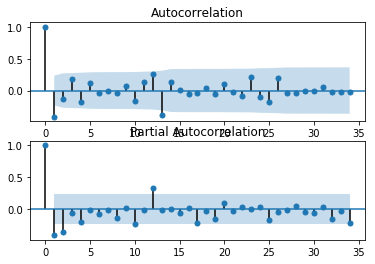

pvalue:  0.481439577351


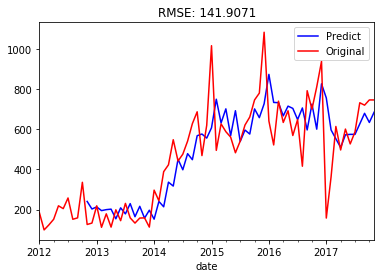

CLASS:  209945


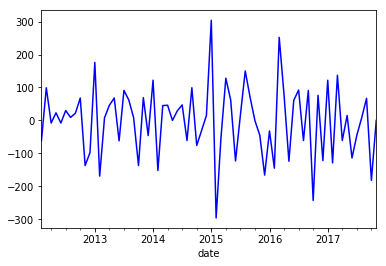

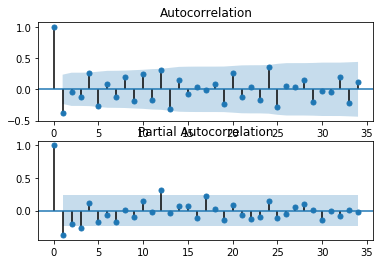

pvalue:  5.7795861069e-11


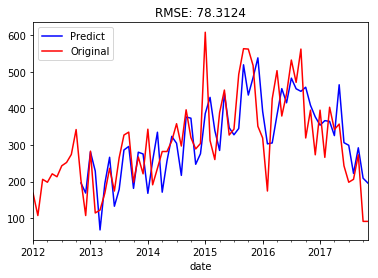

CLASS:  883691


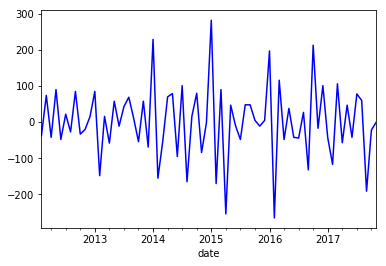

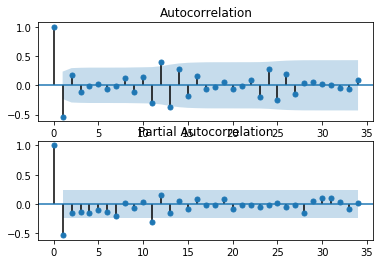

pvalue:  0.000381319125675


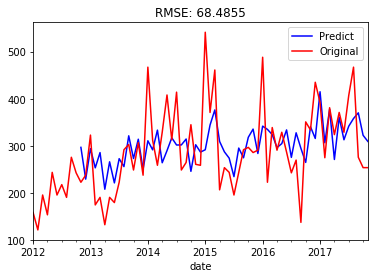

CLASS:  482497


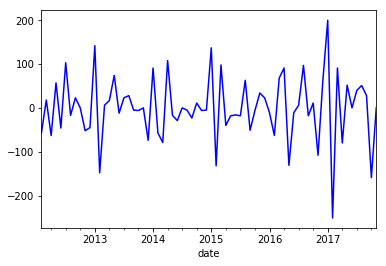

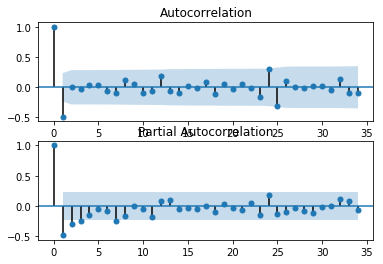

pvalue:  4.09369414952e-05


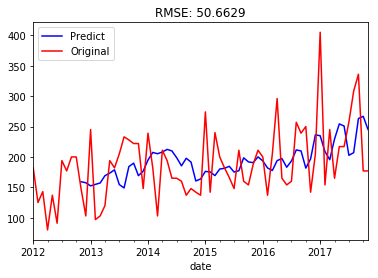

CLASS:  395234


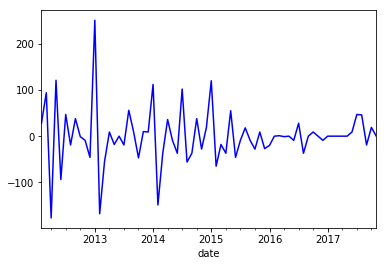

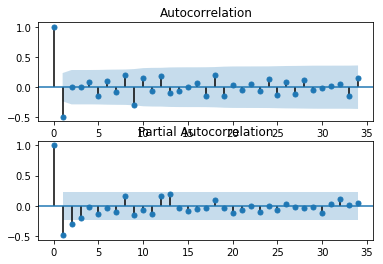

pvalue:  1.82913330949e-17


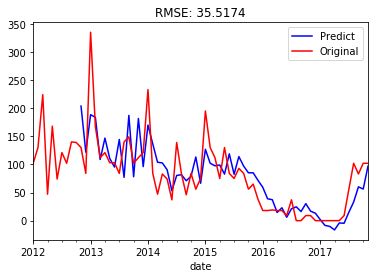

CLASS:  714152


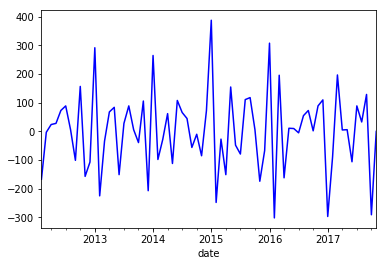

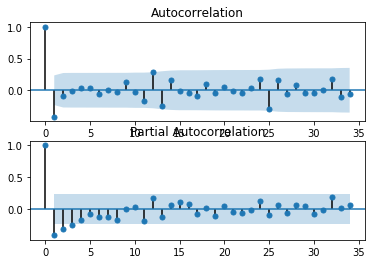

pvalue:  8.90551176059e-10


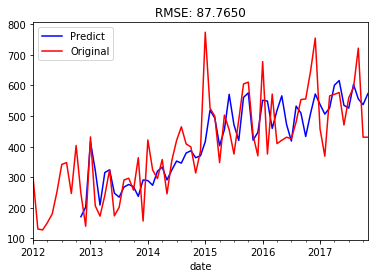

CLASS:  614059


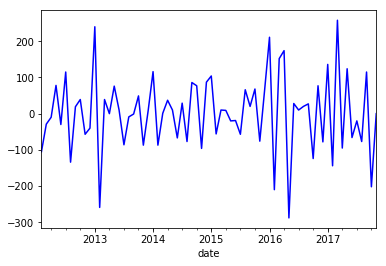

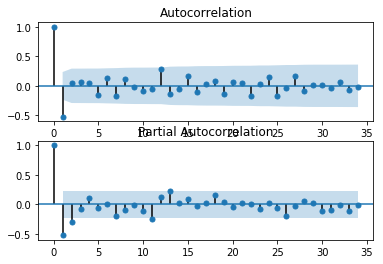

pvalue:  4.70608992756e-17


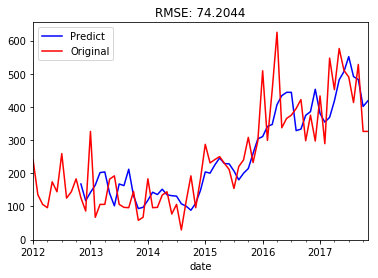

CLASS:  379876


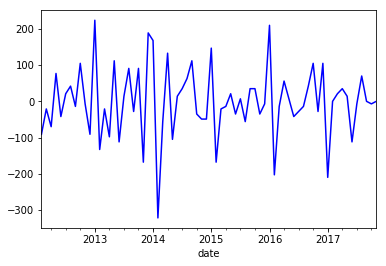

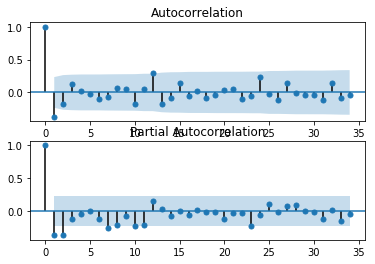

pvalue:  8.62968378946e-06


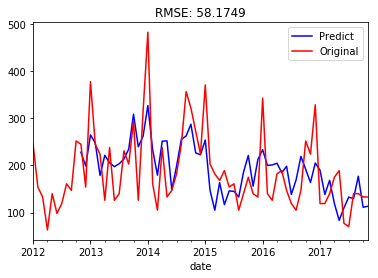

CLASS:  125403


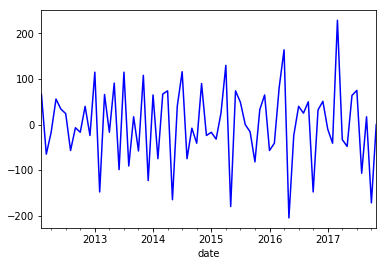

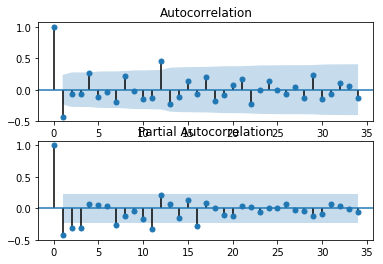

pvalue:  4.71299045729e-08


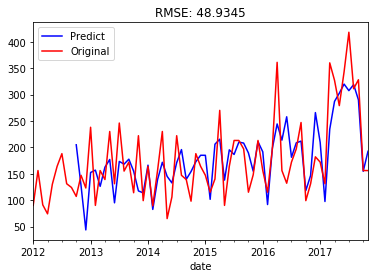

CLASS:  472603


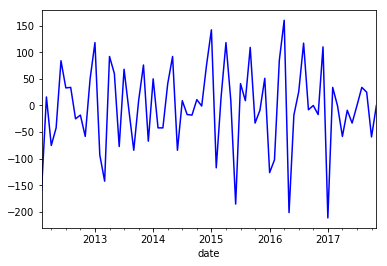

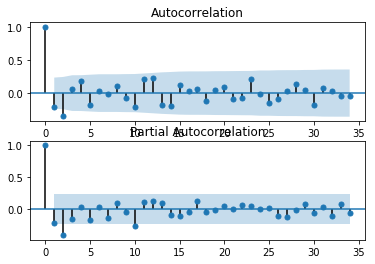

pvalue:  9.30826390469e-12


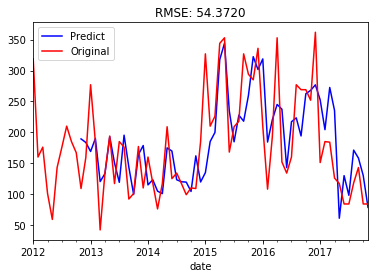

CLASS:  304458


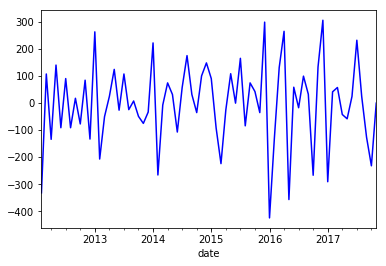

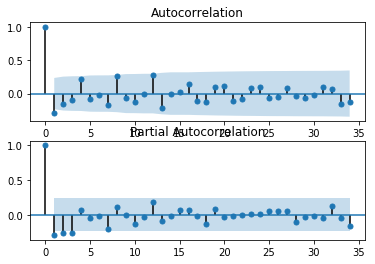

pvalue:  3.72449531782e-13


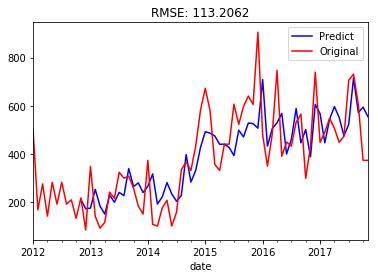

CLASS:  713651


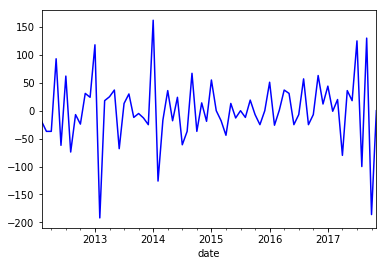

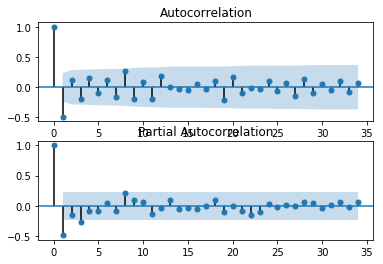

pvalue:  2.63352504807e-11


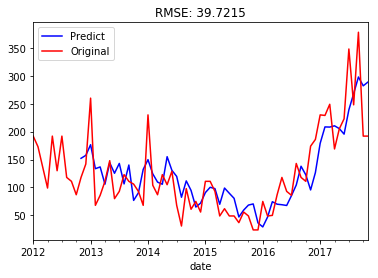

CLASS:  354068


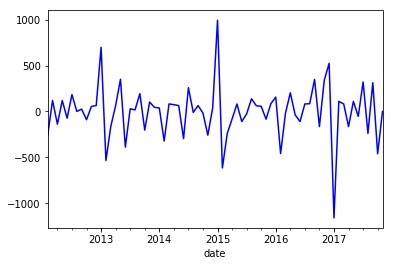

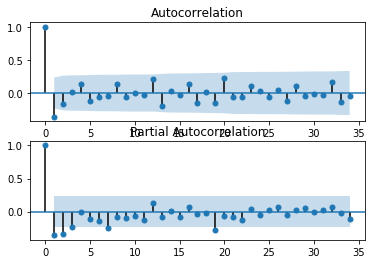

pvalue:  1.1783574751e-11


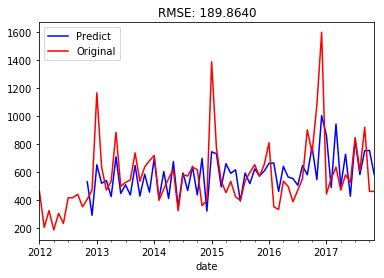

CLASS:  603972


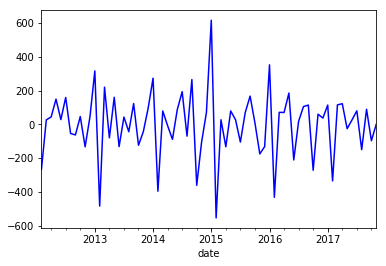

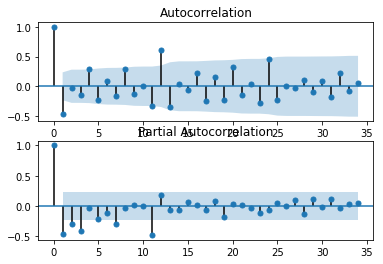

pvalue:  0.0013419559864


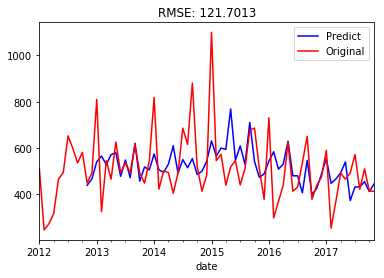

CLASS:  321683


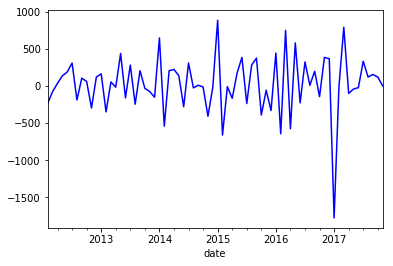

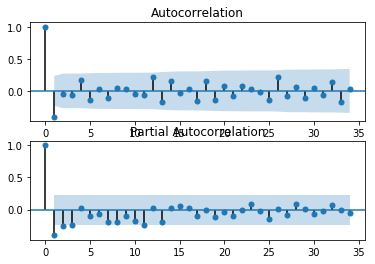

pvalue:  9.35875250793e-07


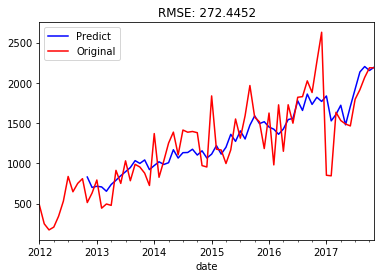

CLASS:  291086


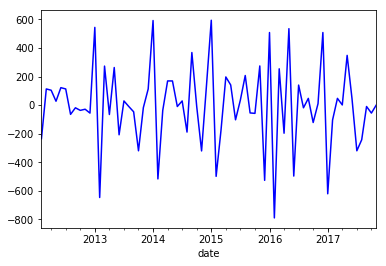

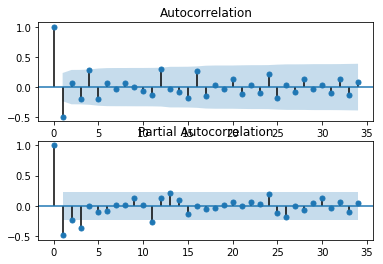

pvalue:  3.85162347918e-14


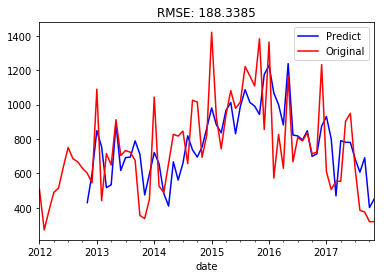

CLASS:  559132


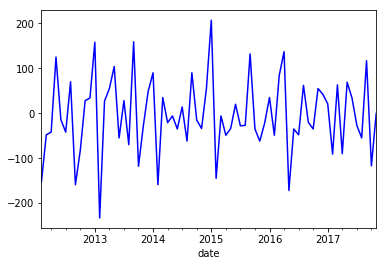

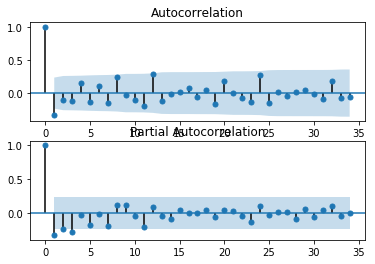

pvalue:  1.92401792128e-13


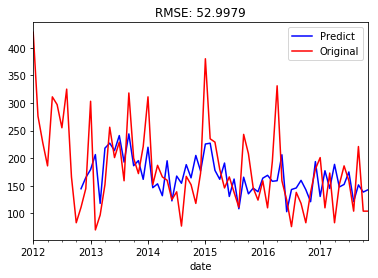

CLASS:  290854


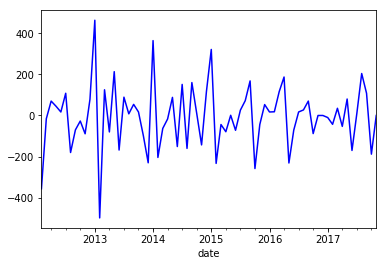

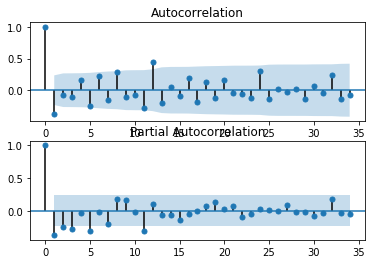

pvalue:  0.000280611761109


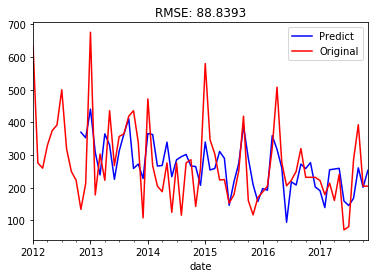

CLASS:  682651


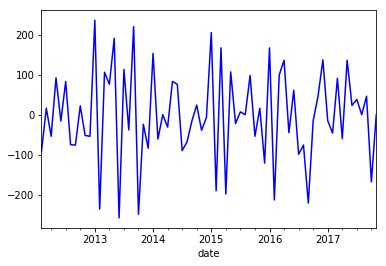

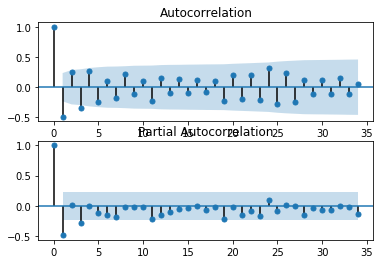

pvalue:  1.16653058782e-09


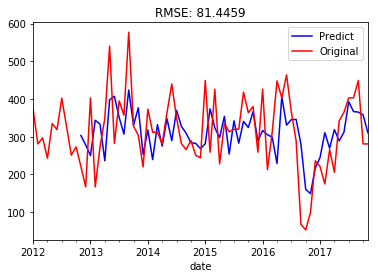

CLASS:  580470


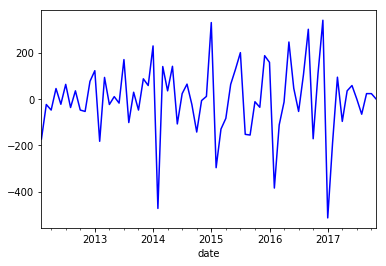

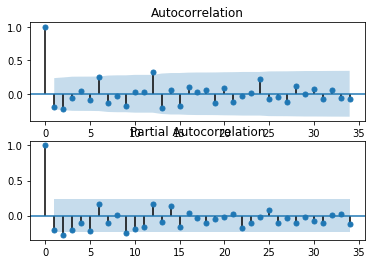

pvalue:  0.000260557727361


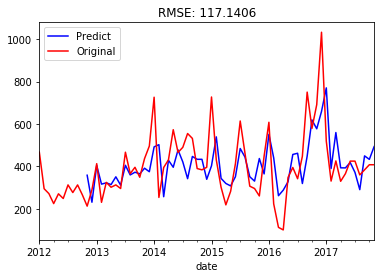

CLASS:  914348


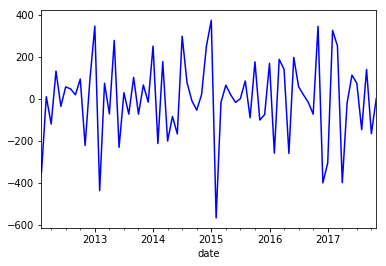

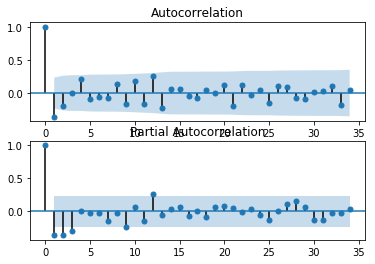

pvalue:  1.11910242114e-15


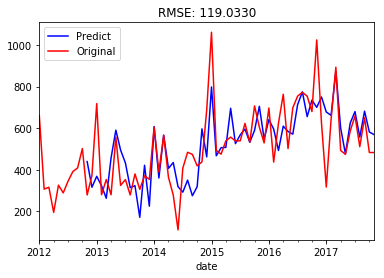

CLASS:  580634


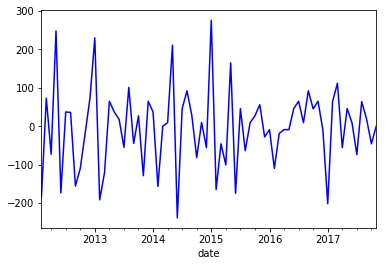

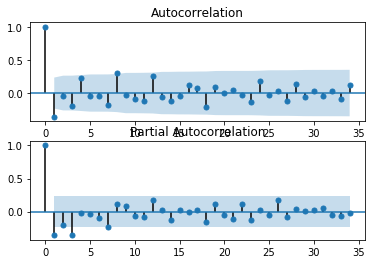

pvalue:  2.4244385327e-13


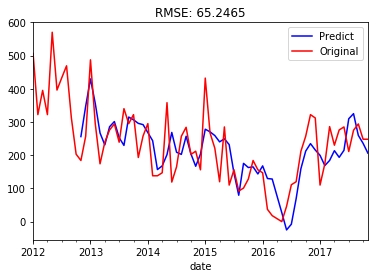

CLASS:  136916


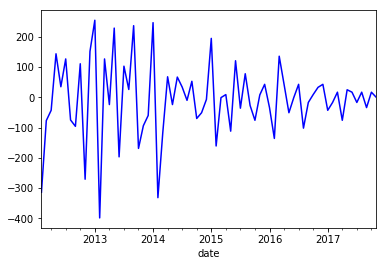

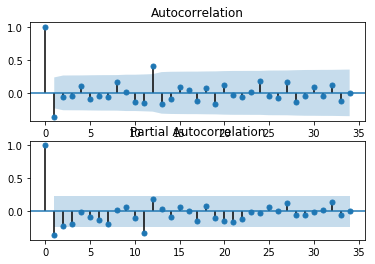

pvalue:  2.05597399991e-05


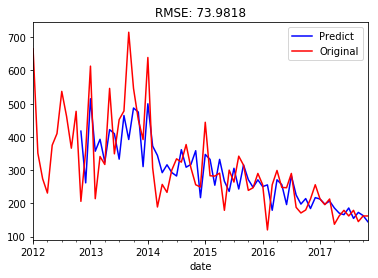

CLASS:  819061


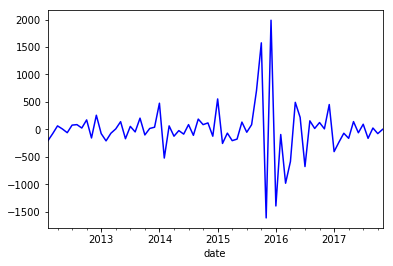

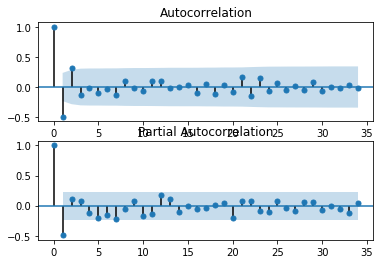

pvalue:  2.78555774228e-26


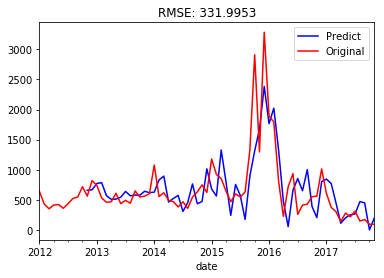

CLASS:  576298


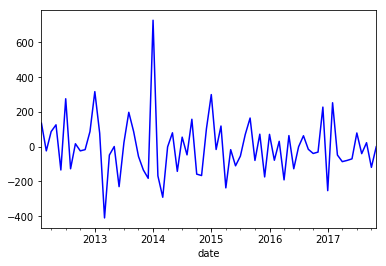

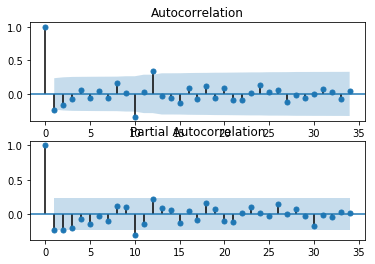

pvalue:  0.00119644042083


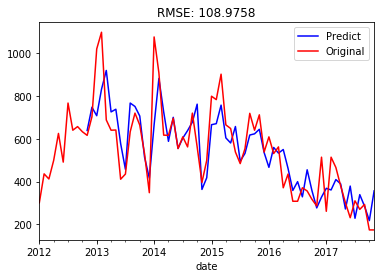

CLASS:  468392


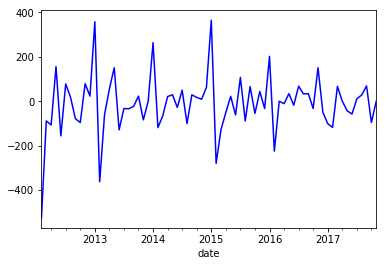

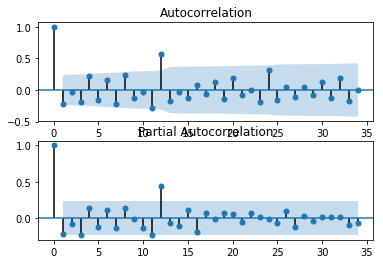

pvalue:  0.220000226016


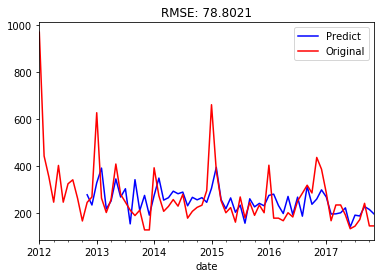

CLASS:  735971


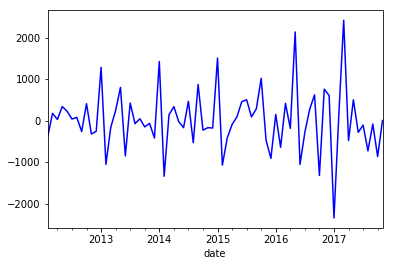

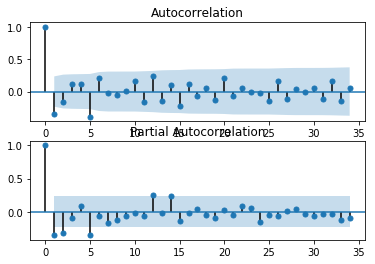

pvalue:  0.0374516421258


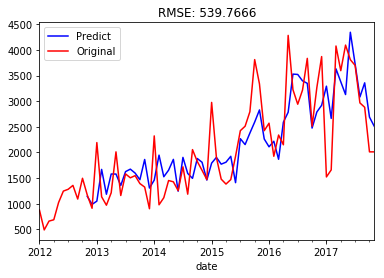

CLASS:  384924


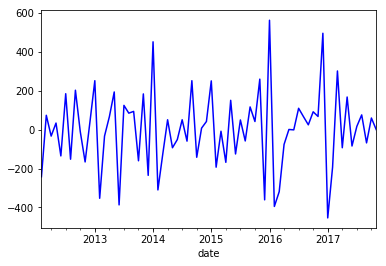

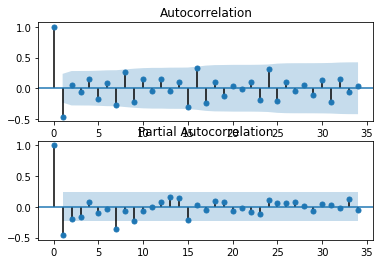

pvalue:  4.8613470453e-05


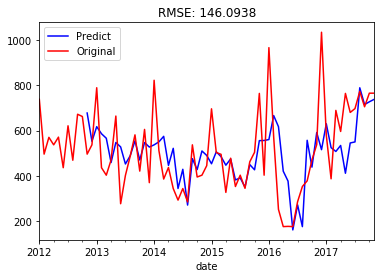

CLASS:  281301


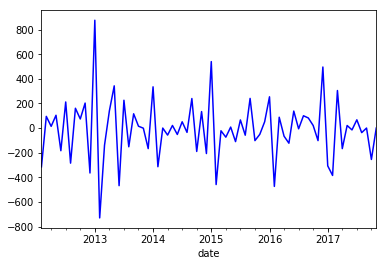

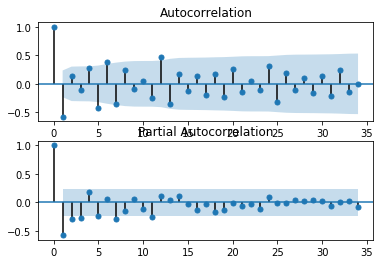

pvalue:  0.00213749402153


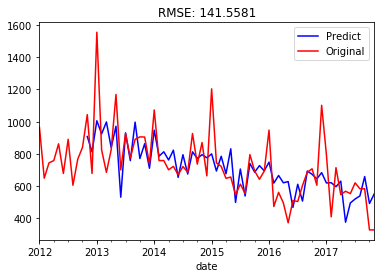

CLASS:  597927


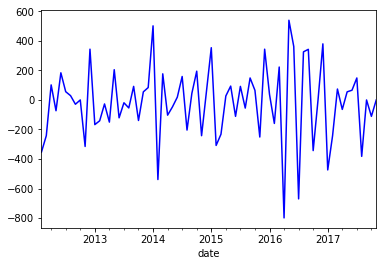

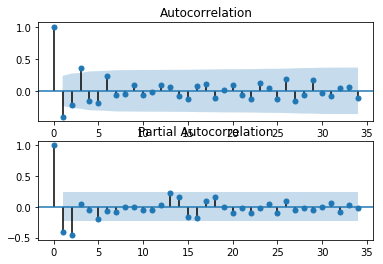

pvalue:  3.36045326655e-22


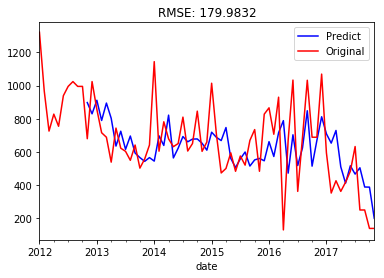

CLASS:  248352


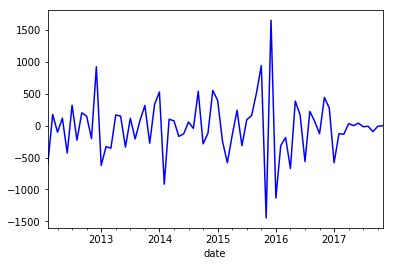

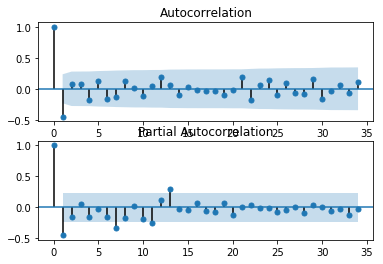

pvalue:  6.42601016497e-05


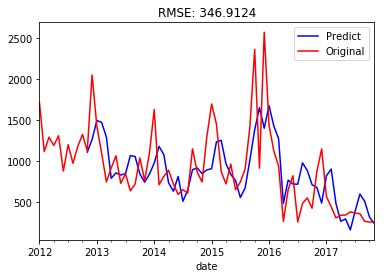

CLASS:  425432


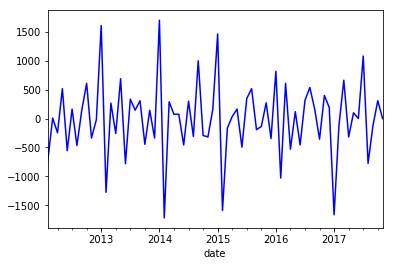

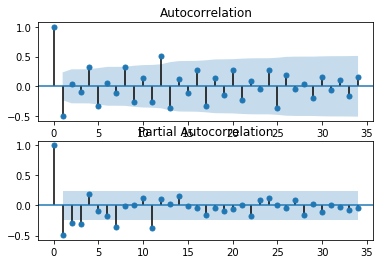

pvalue:  0.000101637886561


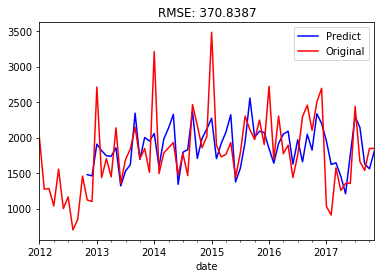

CLASS:  178529


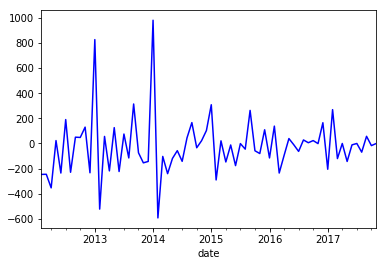

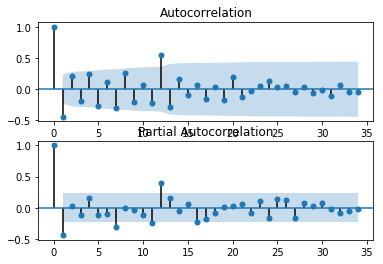

pvalue:  0.0167661995513


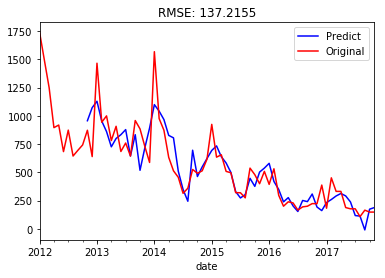

CLASS:  349023


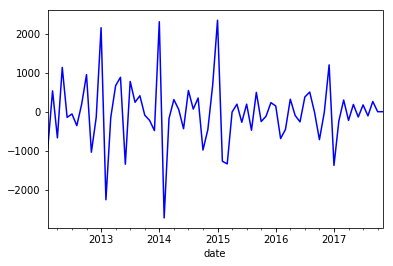

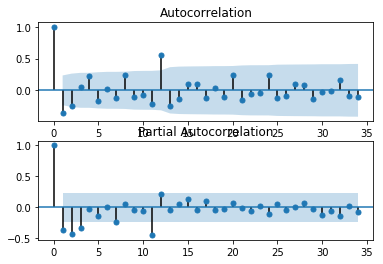

pvalue:  0.0151256877588


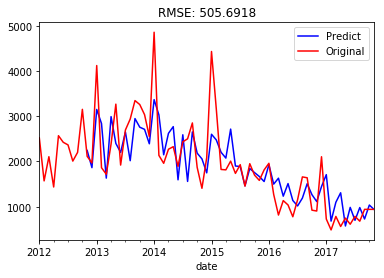

CLASS:  265980


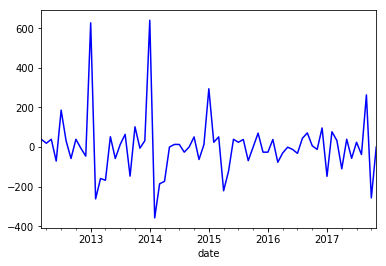

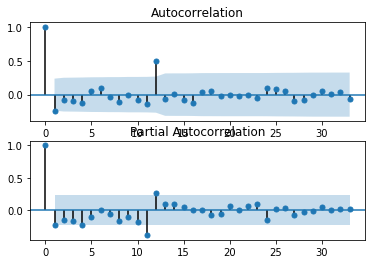

pvalue:  2.04254037224e-05


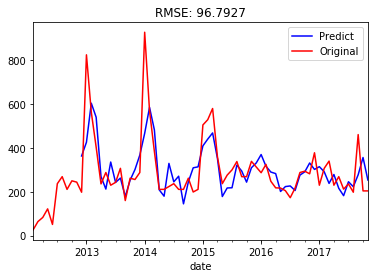

CLASS:  923841


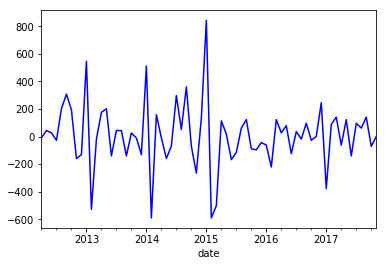

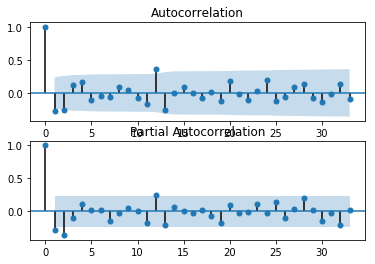

pvalue:  8.75355745925e-16


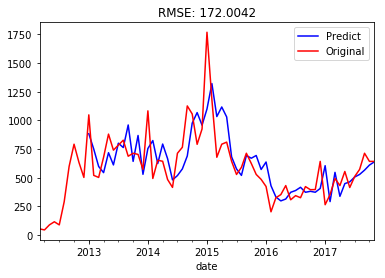

CLASS:  732758


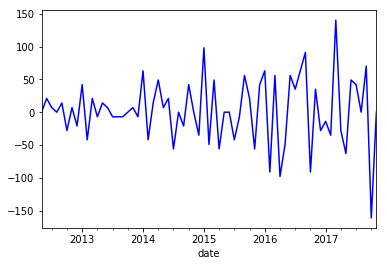

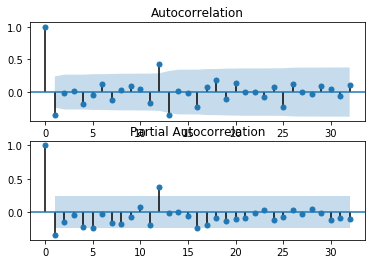

pvalue:  0.367874199664


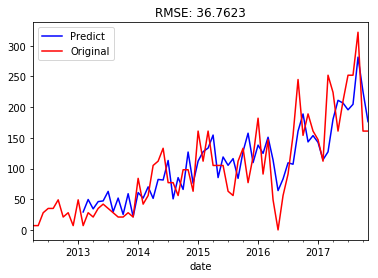

CLASS:  745137


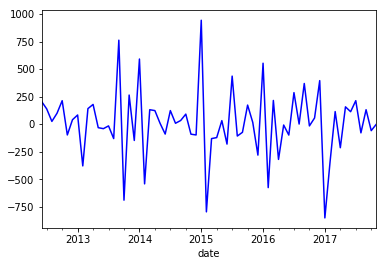

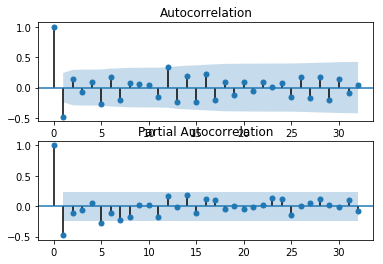

pvalue:  3.84374922364e-06


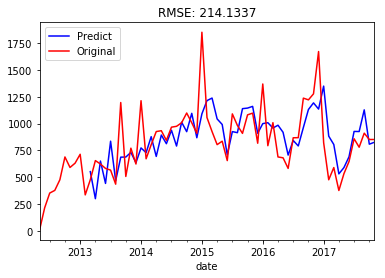

CLASS:  786351


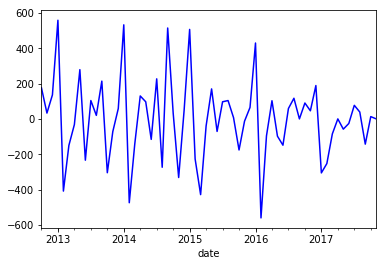

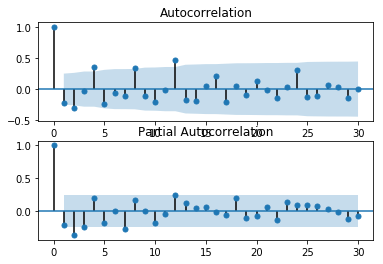

pvalue:  0.144405230555


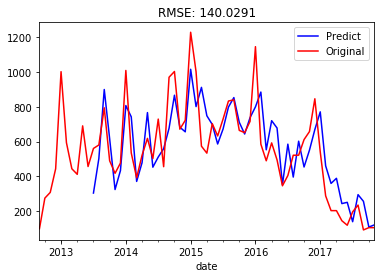

CLASS:  347384


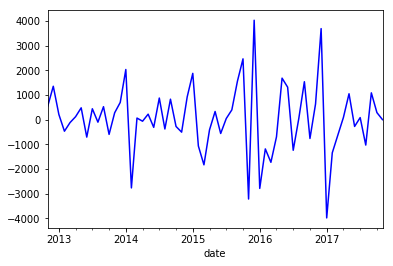

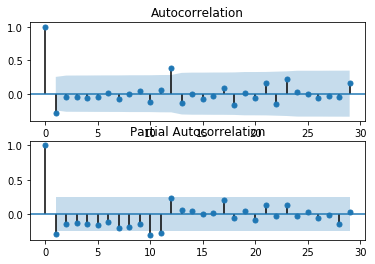

pvalue:  1.57912605449e-08


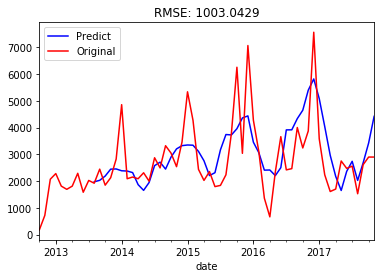

CLASS:  291514


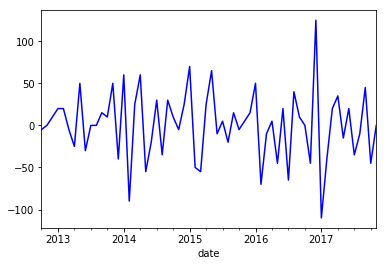

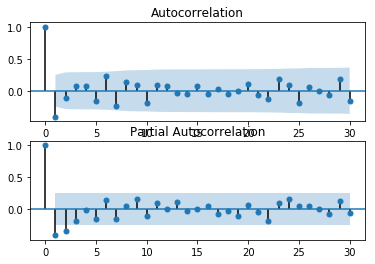

pvalue:  6.0538988552e-15


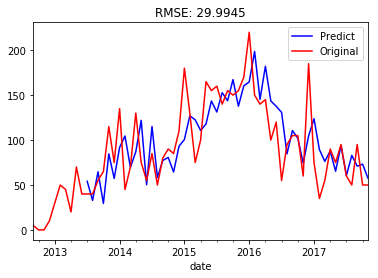

CLASS:  905745


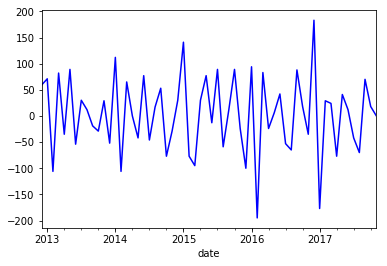

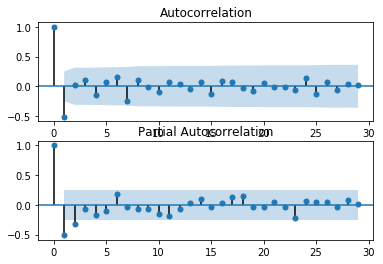

pvalue:  2.73148249339e-16


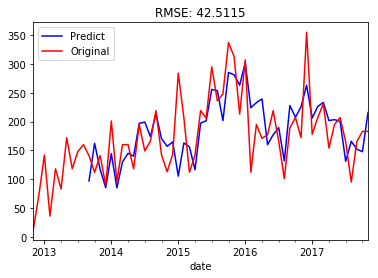

CLASS:  175962


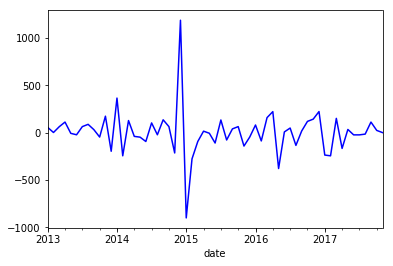

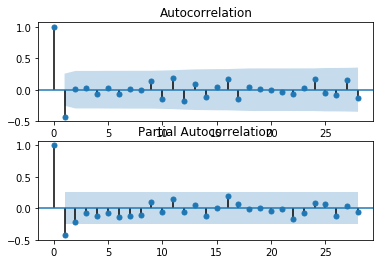

pvalue:  8.85626229732e-12


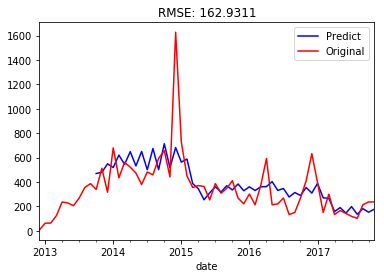

CLASS:  651782


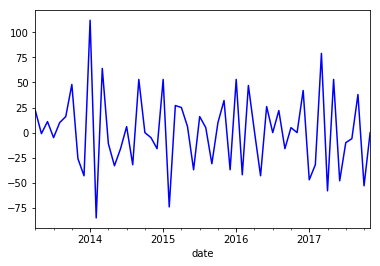

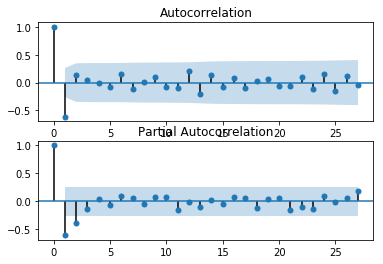

pvalue:  8.6787108501e-09


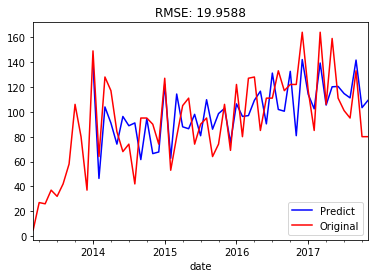

CLASS:  221795


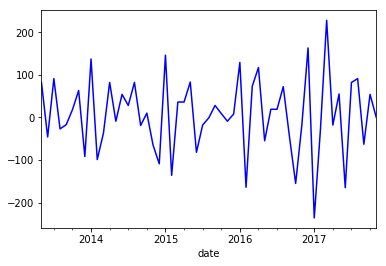

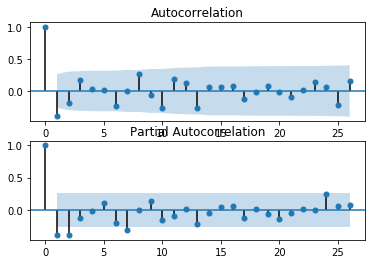

pvalue:  0.000229640834329


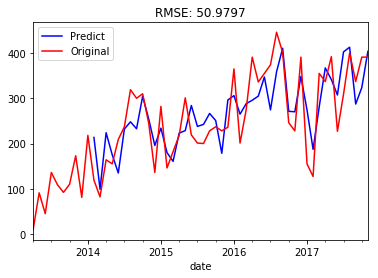

CLASS:  671482


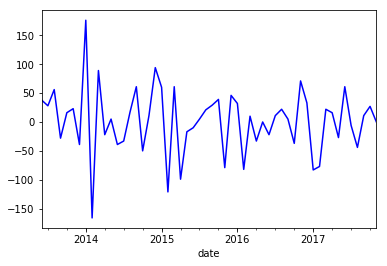

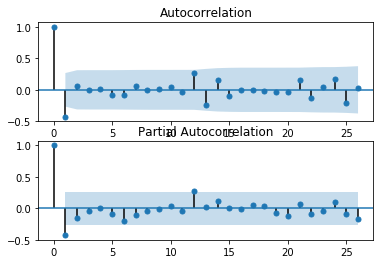

pvalue:  0.0303550936529


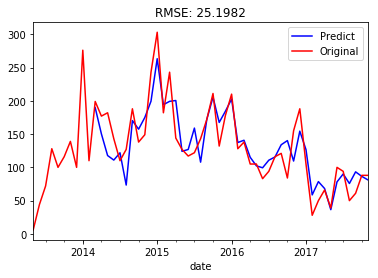

CLASS:  871642


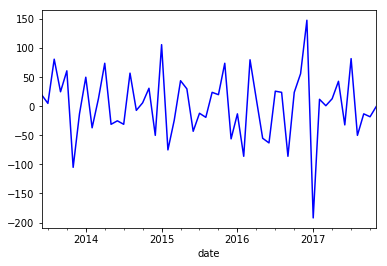

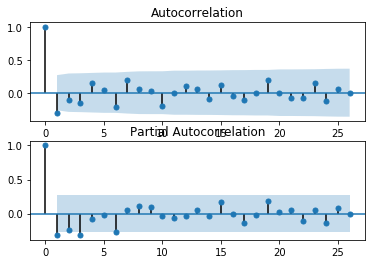

pvalue:  3.69489679016e-06


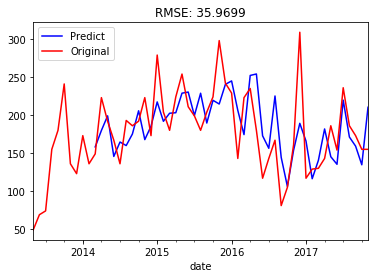

CLASS:  308913


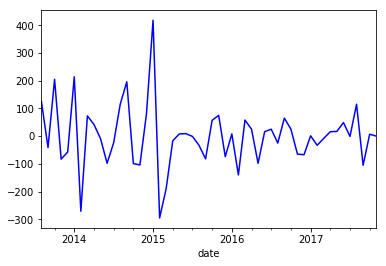

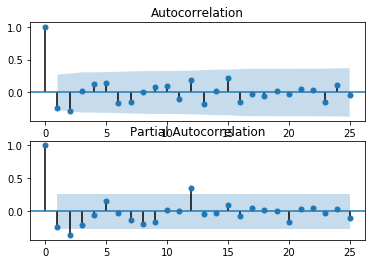

pvalue:  2.03256377696e-09


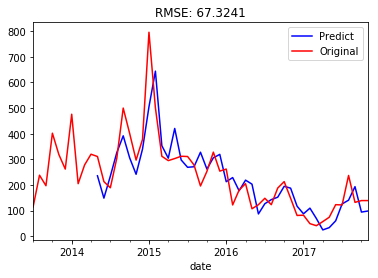

CLASS:  854079


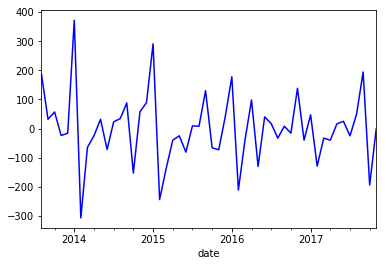

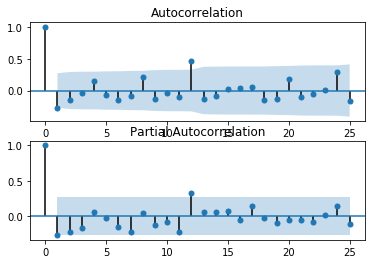

pvalue:  0.0348587384166


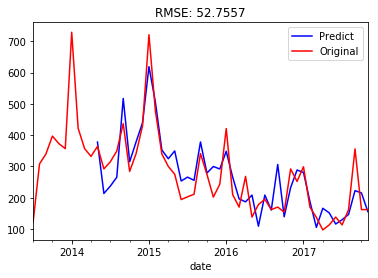

CLASS:  621073


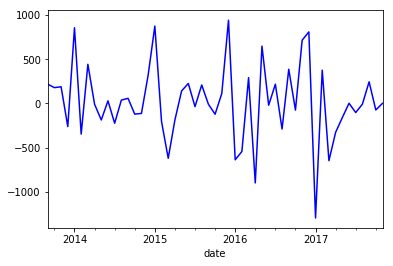

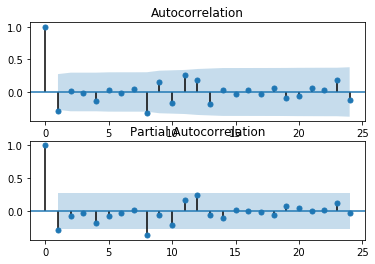

pvalue:  8.16851592734e-16


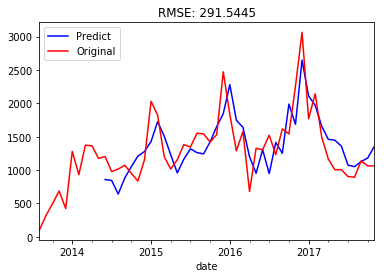

CLASS:  356986


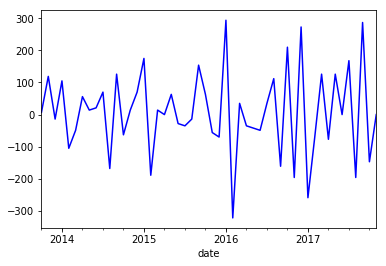

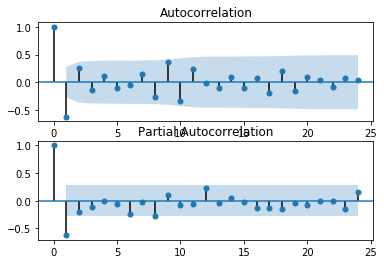

pvalue:  5.40832677442e-11


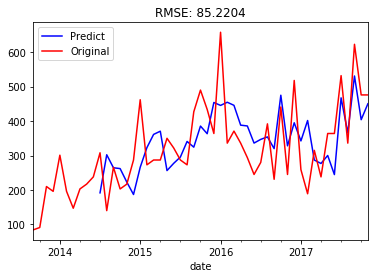

CLASS:  560265


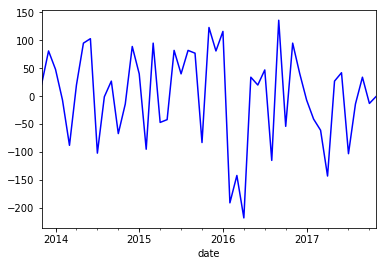

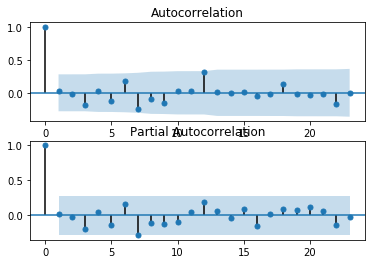

pvalue:  6.32310634937e-09


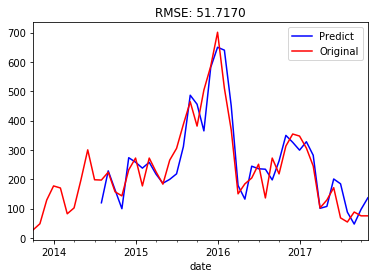

CLASS:  436105


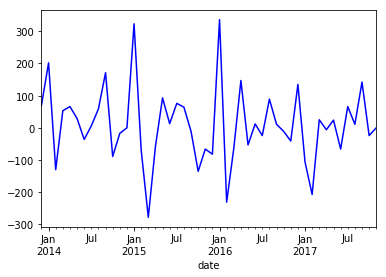

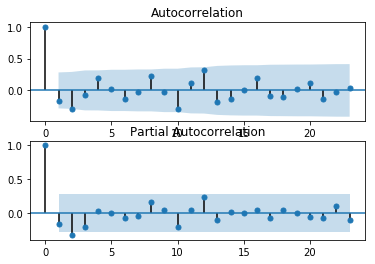

pvalue:  1.89040756812e-07


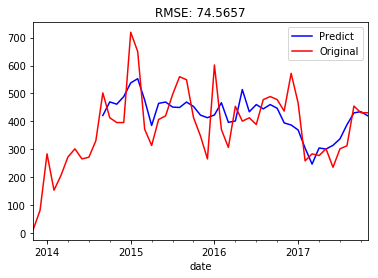

CLASS:  360648


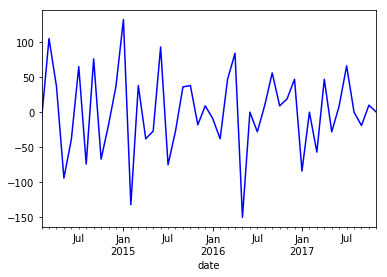

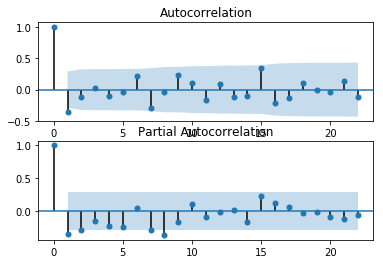

pvalue:  5.72790589354e-06


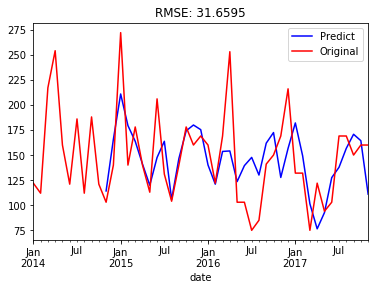

CLASS:  124140


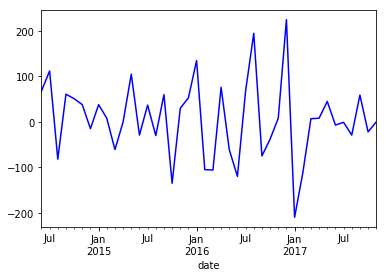

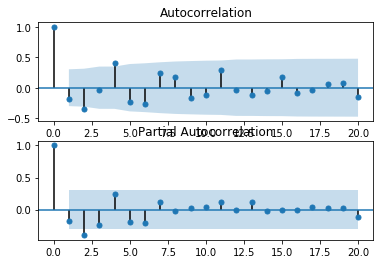

pvalue:  0.00174306534102


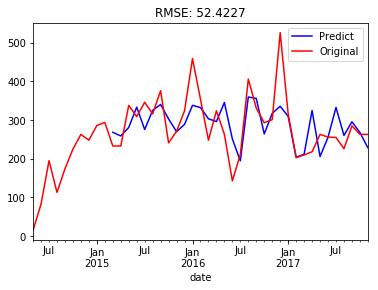

CLASS:  496459


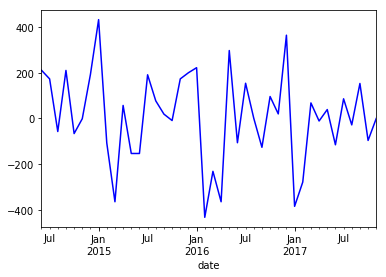

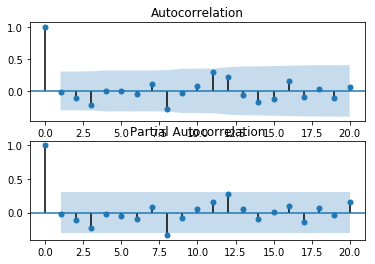

pvalue:  0.000115446532861


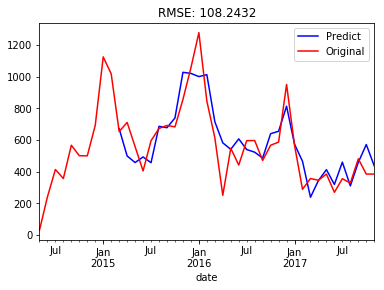

CLASS:  281792


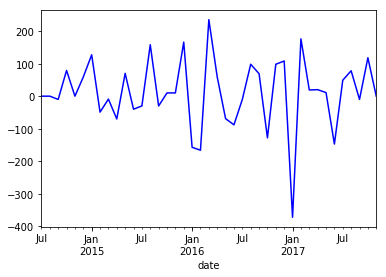

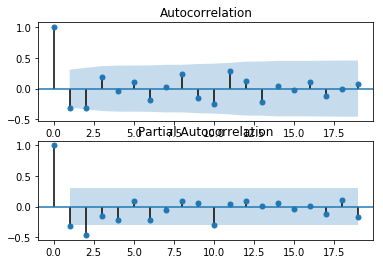

pvalue:  3.01340013954e-05


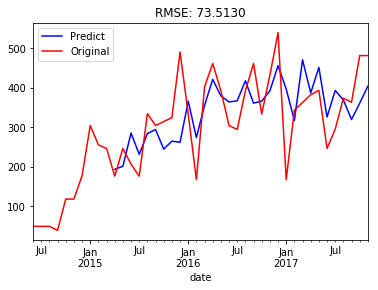

CLASS:  289386


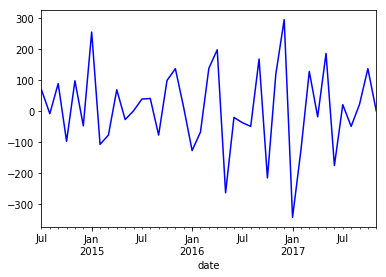

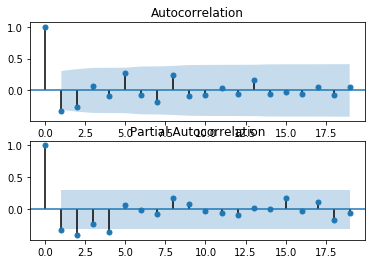

pvalue:  2.74495756224e-07


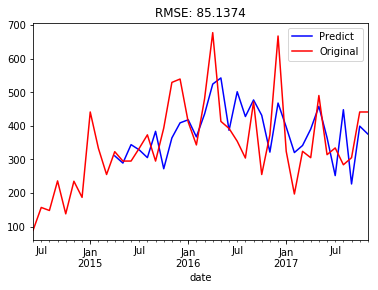

CLASS:  739296


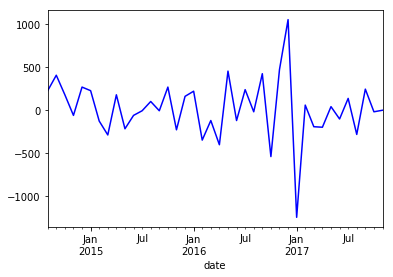

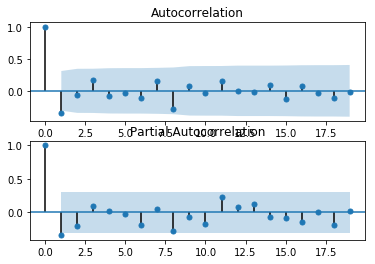

pvalue:  3.62965846017e-08


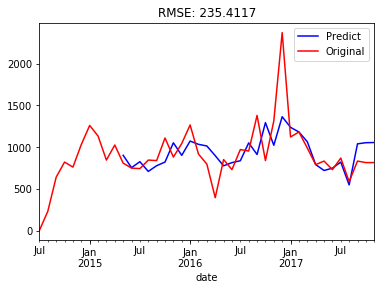

CLASS:  219195


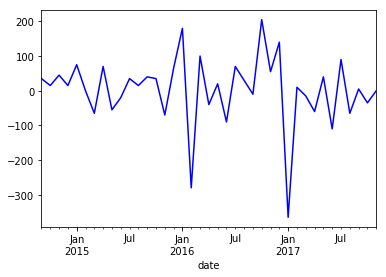

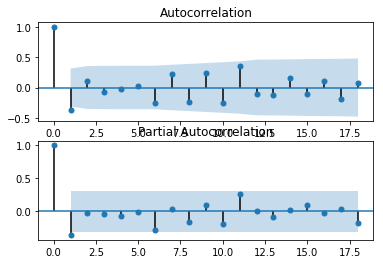

pvalue:  1.64168160408e-14


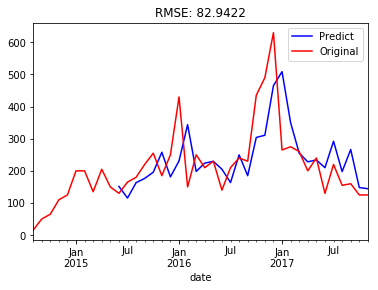

CLASS:  978089


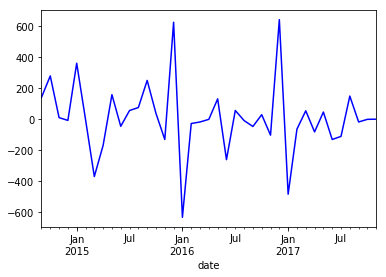

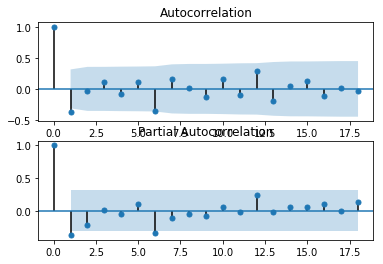

pvalue:  3.06208183071e-08


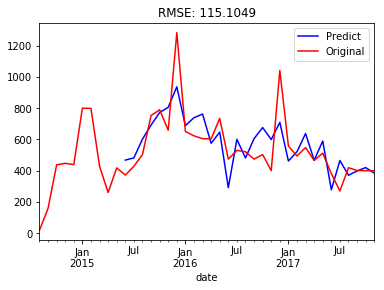

CLASS:  591790


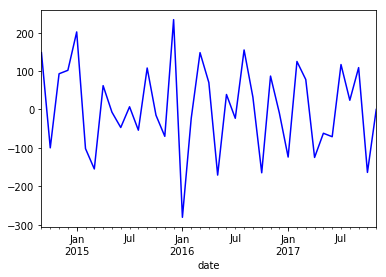

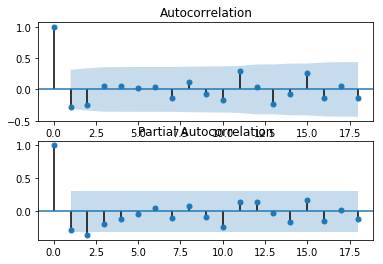

pvalue:  1.14235207435e-05


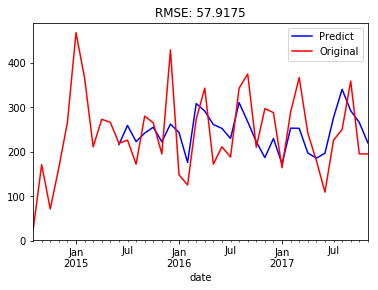

CLASS:  649213


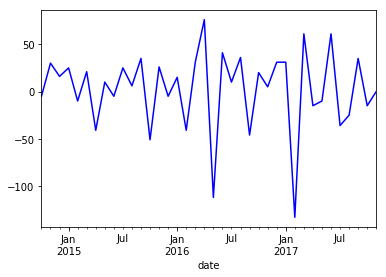

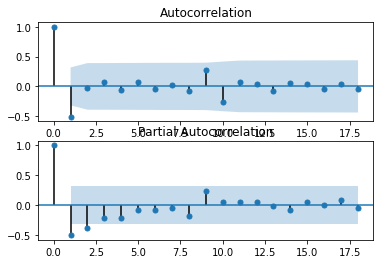

pvalue:  1.09658738822e-05


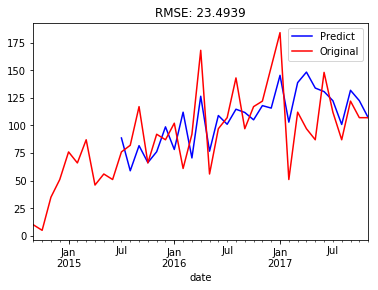

CLASS:  714860


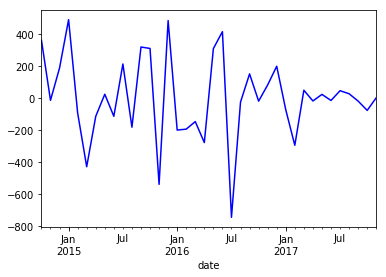

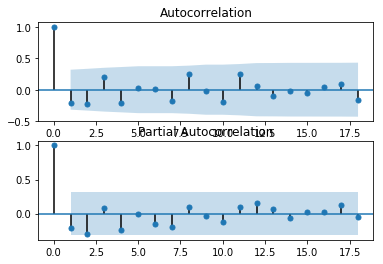

pvalue:  4.8484570973e-08


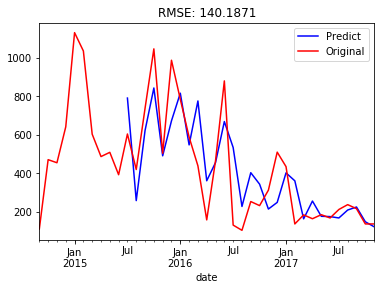

CLASS:  741152


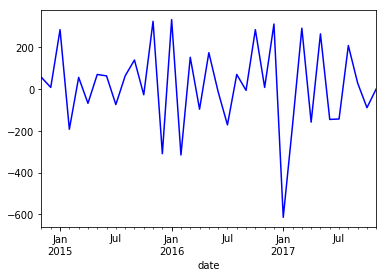

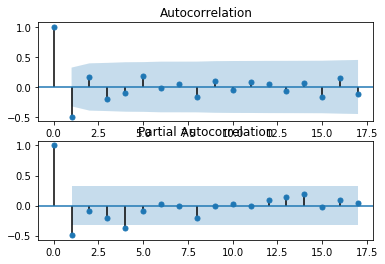

pvalue:  6.06488588762e-06


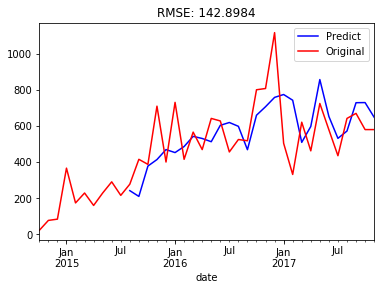

CLASS:  963845


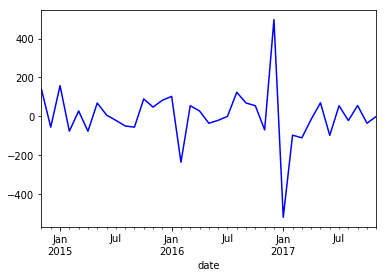

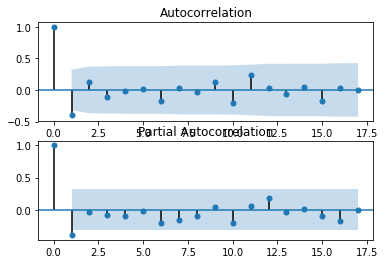

pvalue:  5.77282572331e-15


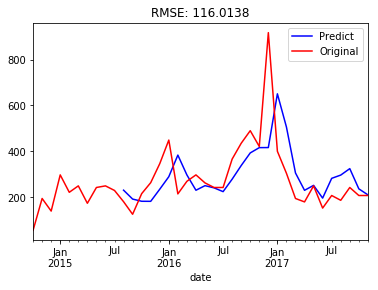

CLASS:  587678


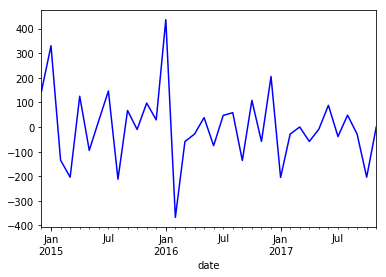

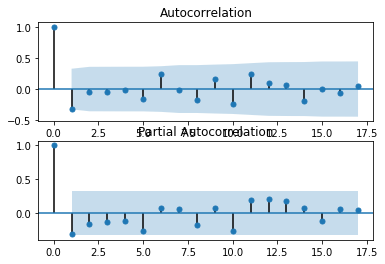

pvalue:  1.53617391224e-12


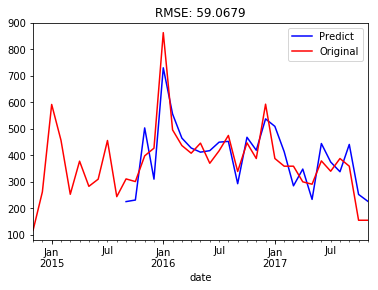

CLASS:  350259


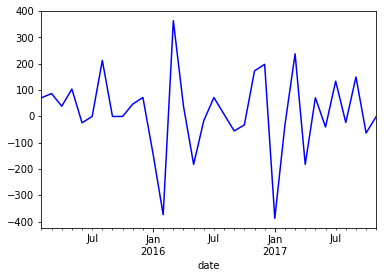

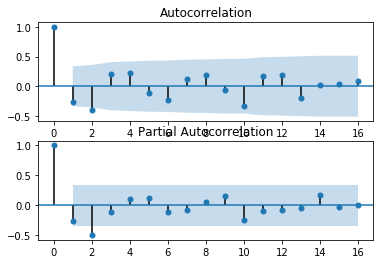

pvalue:  4.24593721779e-11


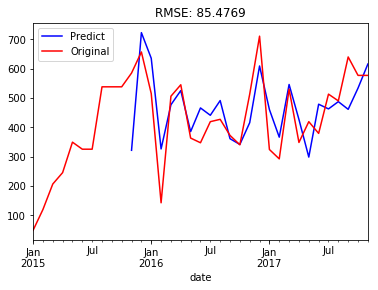

CLASS:  924154


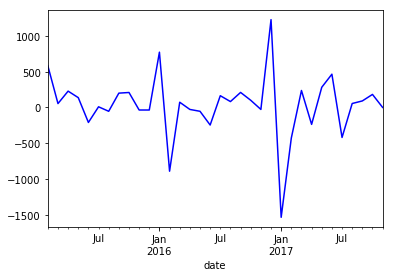

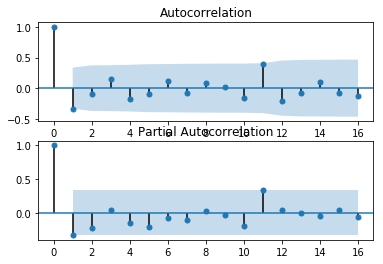

pvalue:  0.765844663542


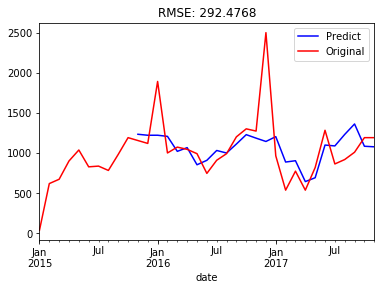

CLASS:  270690


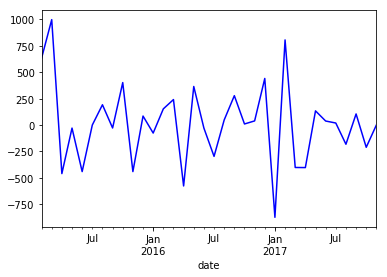

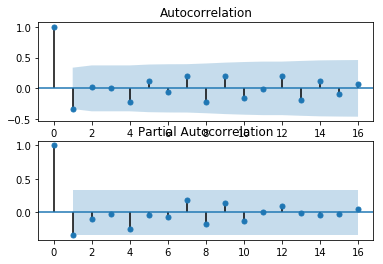

pvalue:  9.52201055486e-12


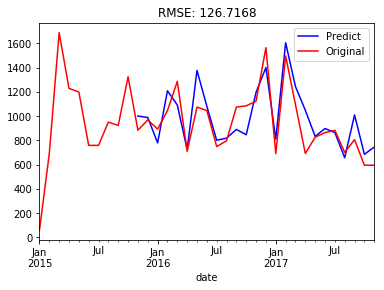

CLASS:  416749


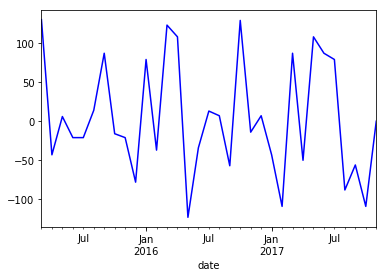

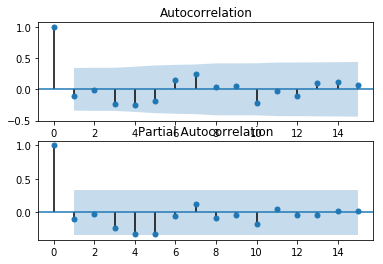

pvalue:  8.12033064603e-05


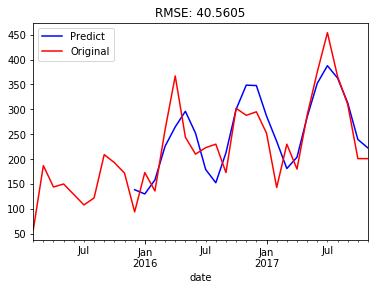

CLASS:  103507


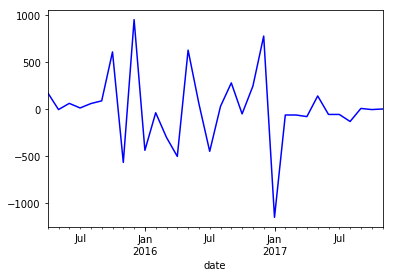

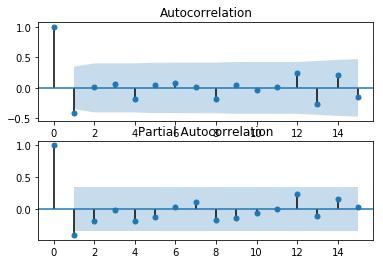

pvalue:  5.63149064218e-06


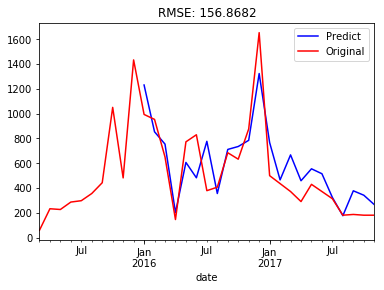

CLASS:  401052


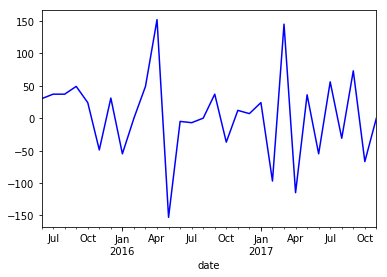

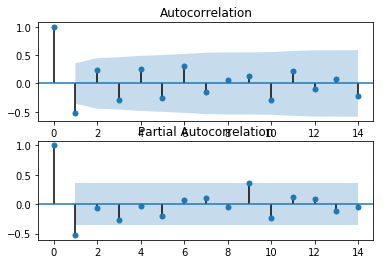

pvalue:  0.546396304054


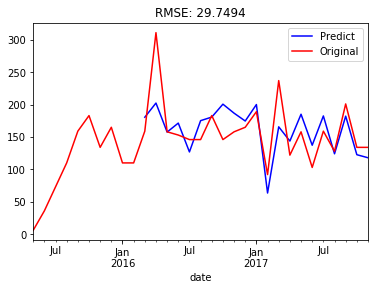

CLASS:  692703


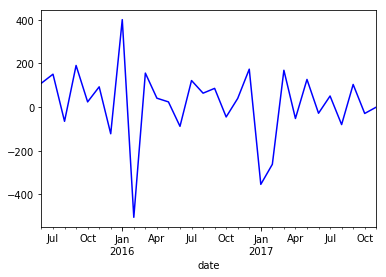

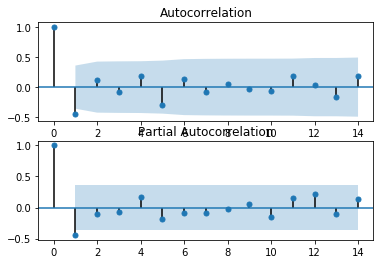

pvalue:  1.5395672315e-13


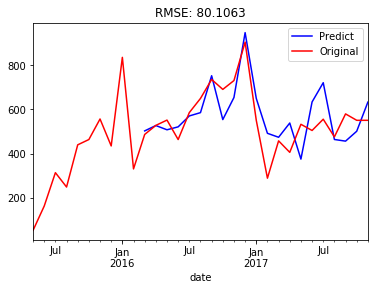

CLASS:  437598


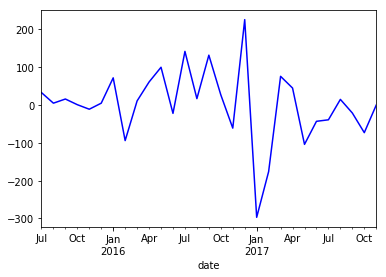

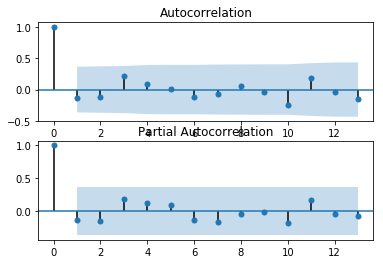

pvalue:  3.89022964751e-07


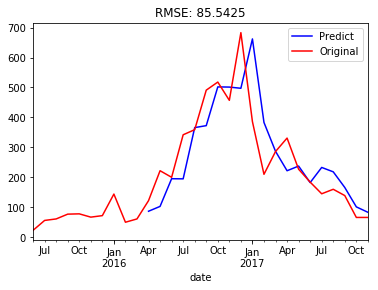

CLASS:  750340


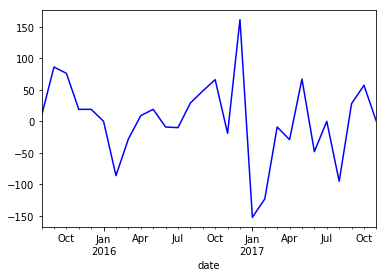

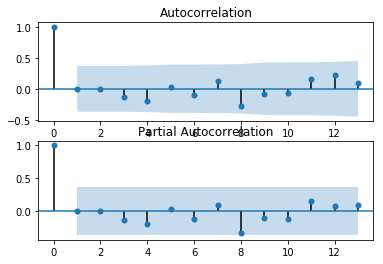

pvalue:  2.4173878319e-05


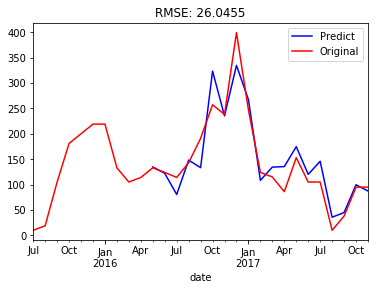

CLASS:  206765


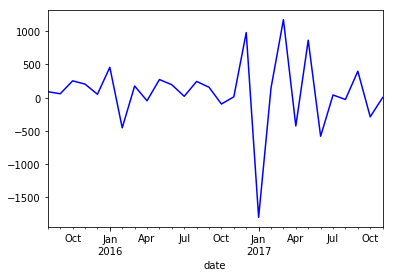

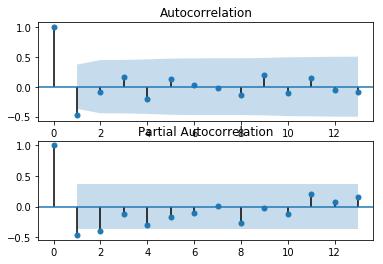

pvalue:  3.71498981858e-08


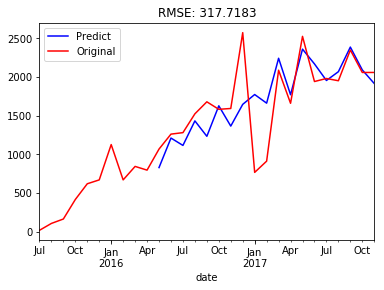

CLASS:  654134


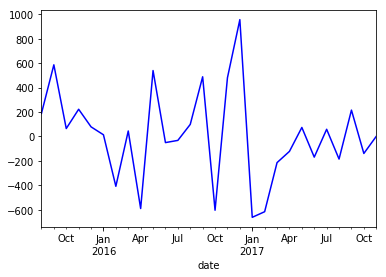

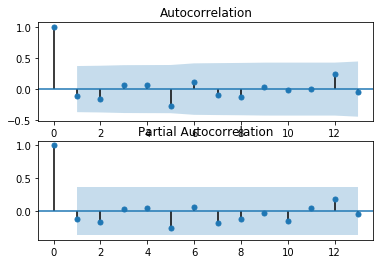

pvalue:  0.00012031254607


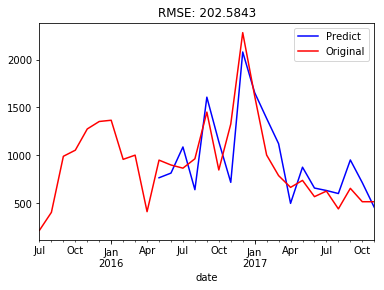

CLASS:  516750


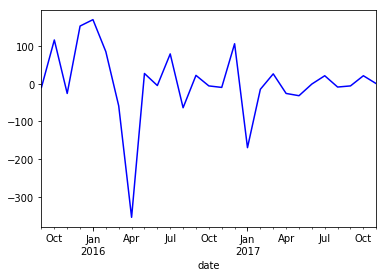

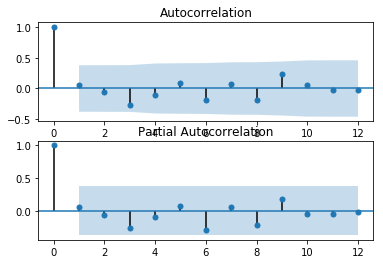

pvalue:  4.73172586588e-05


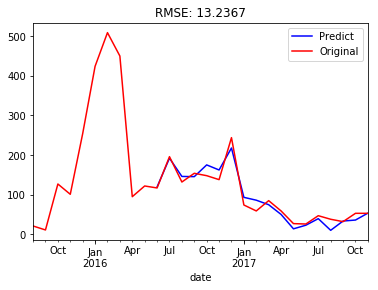

CLASS:  810398


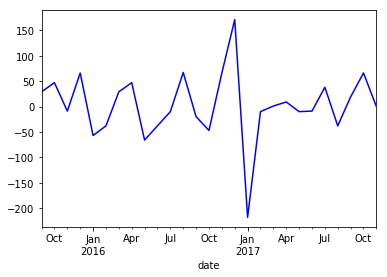

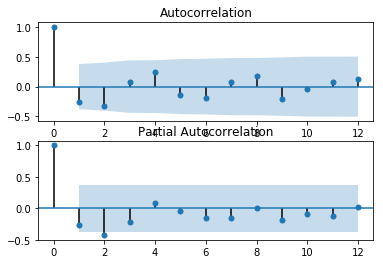

pvalue:  1.01134509424e-07


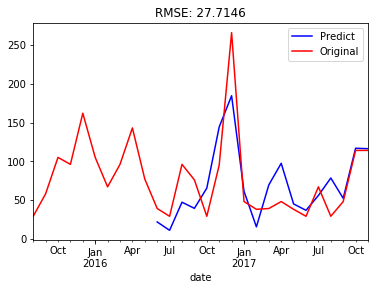

CLASS:  348641


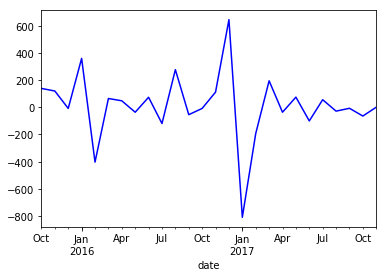

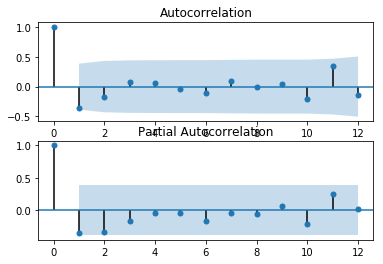

pvalue:  1.93497761723e-06


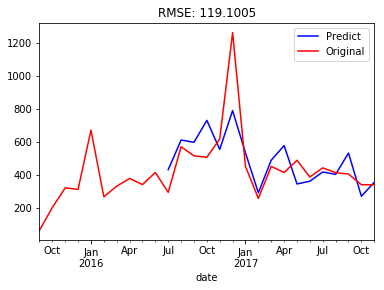

CLASS:  492952


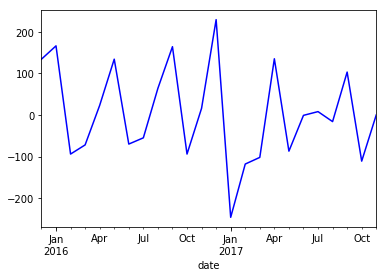

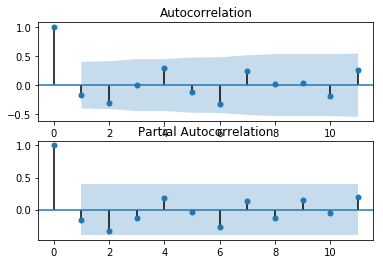

pvalue:  1.52554051962e-06


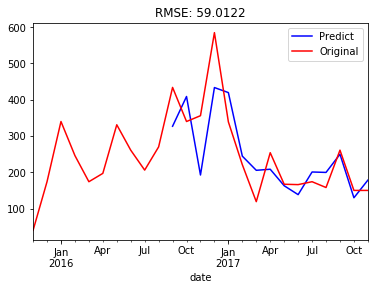

CLASS:  510309


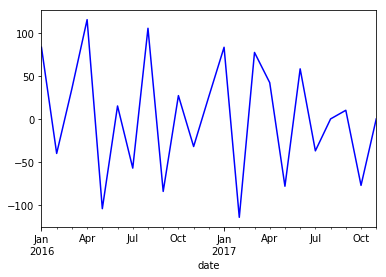

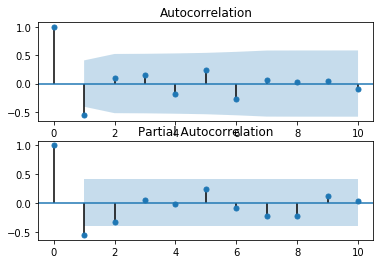

pvalue:  0.862464188627


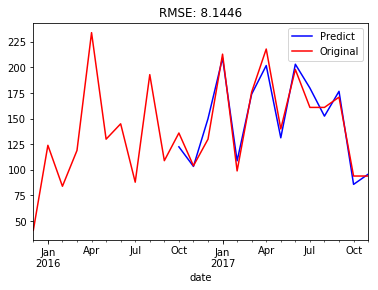

CLASS:  736094


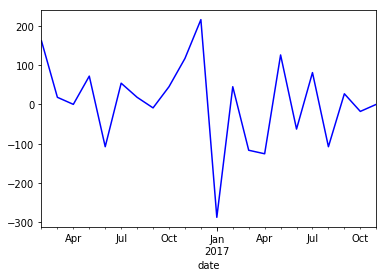

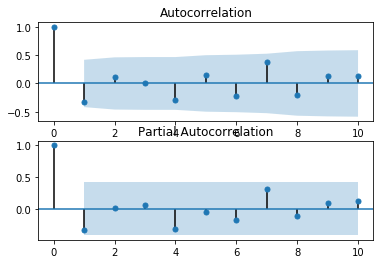

pvalue:  1.14489558487e-08


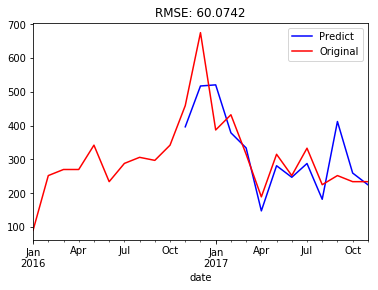

CLASS:  186250


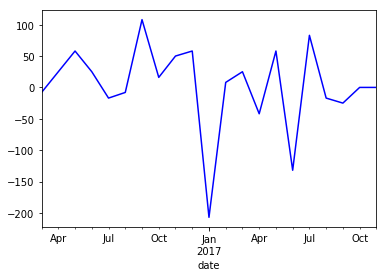

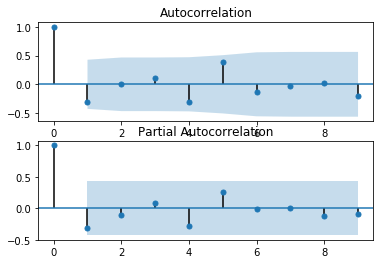

pvalue:  0.95853208606


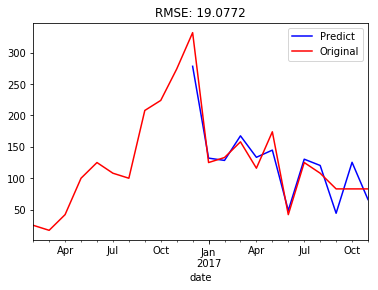

CLASS:  953842


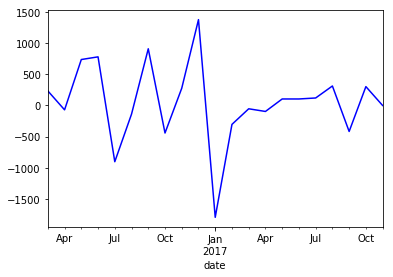

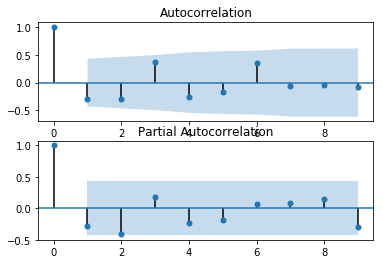

pvalue:  0.95853208606


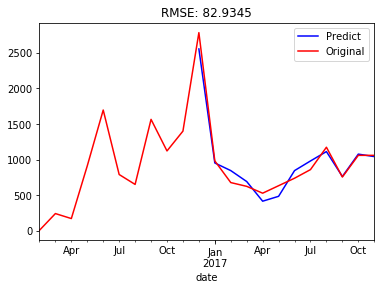

CLASS:  250658


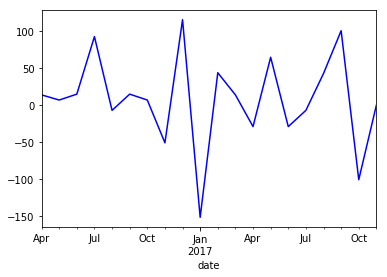

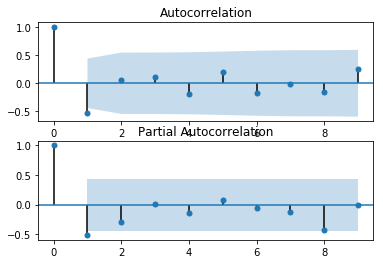

pvalue:  0.0789569265523


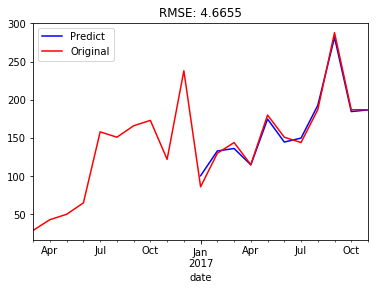

CLASS:  540712


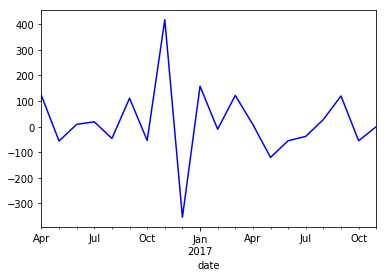

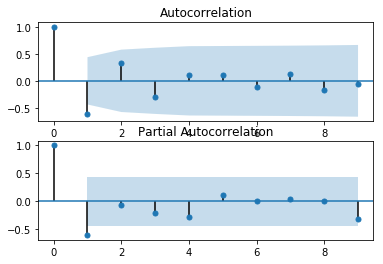

pvalue:  0.95853208606


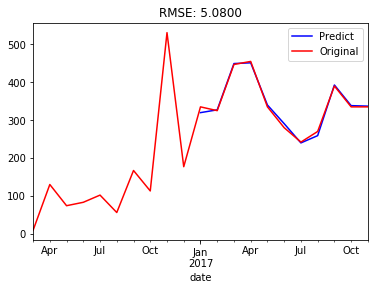

CLASS:  526401


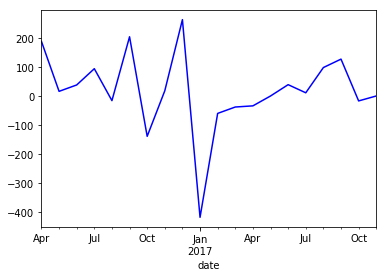

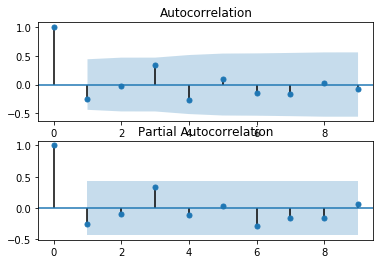

pvalue:  0.000167592974482


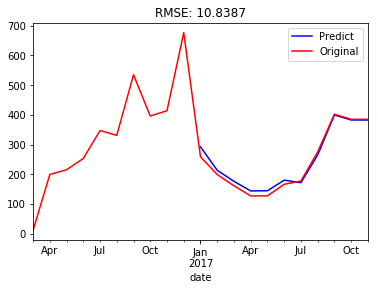

CLASS:  378356


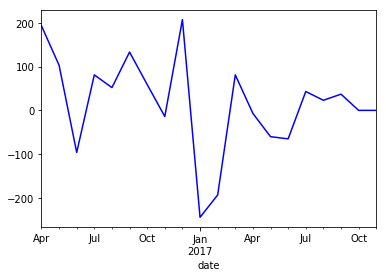

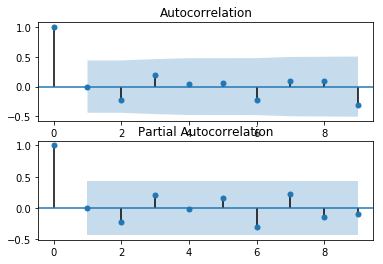

pvalue:  0.95853208606


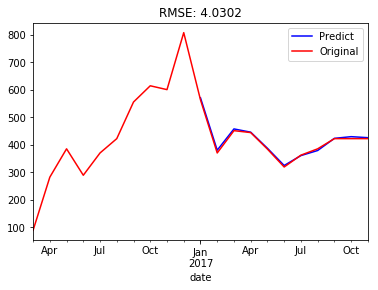

CLASS:  245609


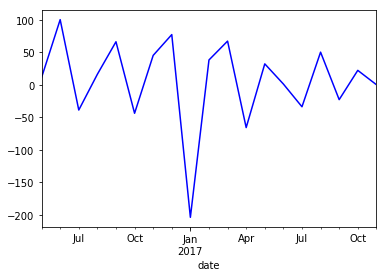

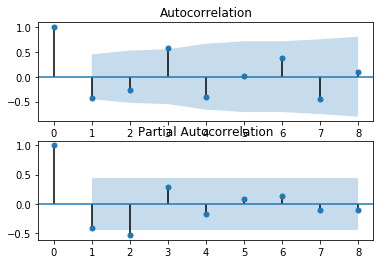

pvalue:  0.95853208606


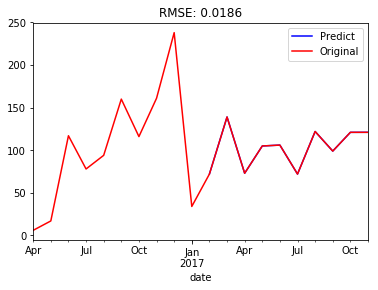

CLASS:  851857


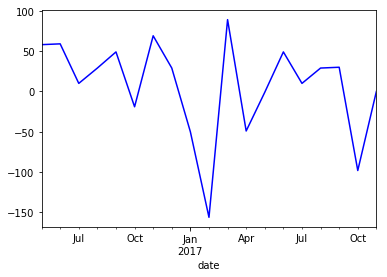

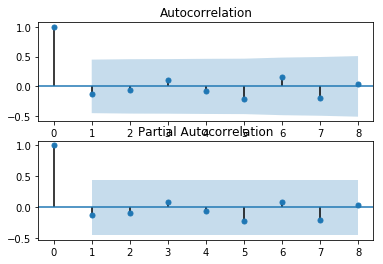

pvalue:  0.95853208606


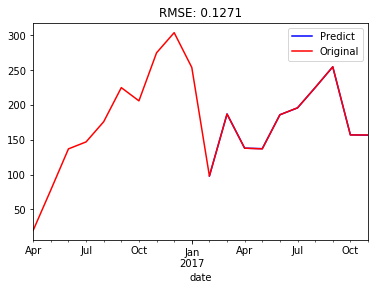

CLASS:  289403


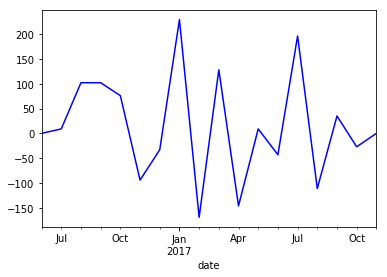

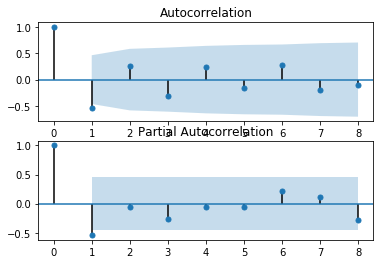

pvalue:  0.000593408978818


ValueError: Insufficient degrees of freedom to estimate

In [14]:
import warnings; warnings.simplefilter('ignore')
from statsmodels.tsa.arima_model import ARMA
import sys
from statsmodels.tsa.stattools import adfuller
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from datetime import datetime

# 移动平均图
def draw_trend(timeSeries, size):
    f = plt.figure(facecolor='white')
    # 对size个数据进行移动平均
    rol_mean = timeSeries.rolling(window=size).mean()
    # 对size个数据进行加权移动平均
    rol_weighted_mean = pd.ewma(timeSeries, span=size)

    timeSeries.plot(color='blue', label='Original')
    rolmean.plot(color='red', label='Rolling Mean')
    rol_weighted_mean.plot(color='black', label='Weighted Rolling Mean')
    plt.legend(loc='best')
    plt.title('Rolling Mean')
    plt.show()

def draw_ts(timeSeries):
    f = plt.figure(facecolor='white')
    timeSeries.plot(color='blue')
    plt.show()

'''
　　Unit Root Test
   The null hypothesis of the Augmented Dickey-Fuller is that there is a unit
   root, with the alternative that there is no unit root. That is to say the
   bigger the p-value the more reason we assert that there is a unit root
'''
def testStationarity(ts):
    dftest = adfuller(ts)
    # 对上述函数求得的值进行语义描述
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    return dfoutput

# 自相关和偏相关图，默认阶数为31阶
def draw_acf_pacf(ts, lags=31):
    f = plt.figure(facecolor='white')
    ax1 = f.add_subplot(211)
    plot_acf(ts, lags=lags, ax=ax1)
    ax2 = f.add_subplot(212)
    plot_pacf(ts, lags=lags, ax=ax2)
    plt.show()
    
def strToDate(dateNum):
    dateStr = str(dateNum)
    return pd.datetime(int(dateStr[0:4]), int(dateStr[4:6]), 1)
def proper_model(data_ts, maxLag):
    init_bic = 100000
    init_p = 0
    init_q = 0
    init_properModel = None
    for p in np.arange(maxLag):
        for q in np.arange(maxLag):
            model = ARMA(data_ts, order=(p, q))
            try:
                results_ARMA = model.fit(disp=-1, method='css')
            except:
                continue
            bic = results_ARMA.bic
            if bic < init_bic:
                init_p = p
                init_q = q
                init_properModel = results_ARMA
                init_bic = bic
    return init_bic, init_p, init_q, init_properModel

finalResult = {}

for value in sorted_result:
    print('CLASS: ', value[0])
    tempDf = pd.DataFrame(value[1], columns = ['date', 'sale_quantity'])
    tempDf['date'] = tempDf['date'].apply(strToDate)
    tempDf = tempDf.set_index('date')
    tempDf = tempDf['sale_quantity']
    tempDf.sort_index(inplace=True)
    tempDf[datetime(2017, 11, 1)] = tempDf[datetime(2017, 10, 1)]

    # 差分
    ts_diff_1 = tempDf.diff(1)
    ts_diff_1.dropna(inplace=True)
    sizeData = len(ts_diff_1)
    draw_ts(ts_diff_1)
    draw_acf_pacf(ts_diff_1, lags=sizeData/2-1)
    pValue = (adfuller(ts_diff_1))[1]
    print('pvalue: ', pValue)

    # model
    _, _, _, result_arma = proper_model(ts_diff_1, 10)
    predict_ts = result_arma.predict(end=datetime(2017, 11, 1))
    # 一阶差分还原
    shift_ts = tempDf.shift(1)
    diff_recover_1 = predict_ts.add(shift_ts)
    tempSeries = tempDf[diff_recover_1.index]
    plt.figure(facecolor='white')
    diff_recover_1.plot(color='blue', label='Predict')
    tempDf.plot(color='red', label='Original')
    plt.legend(loc='best')
    plt.title('RMSE: %.4f'% np.sqrt(sum(((diff_recover_1-tempSeries).dropna())**2)/tempSeries.size))
    plt.show()

    finalResult[value[0]] = diff_recover_1[datetime(2017, 11, 1)]


In [ ]:
# 自相关和偏相关图，默认阶数为31阶
def draw_acf_pacf(ts, lags=31):
    f = plt.figure(facecolor='white')
    ax1 = f.add_subplot(211)
    plot_acf(ts, lags=lags, ax=ax1)
    ax2 = f.add_subplot(212)
    plot_pacf(ts, lags=lags, ax=ax2)
    plt.show()
for value in sorted_result[80:]:
    print('CLASS: ', value[0])
    tempDf = pd.DataFrame(value[1], columns = ['date', 'sale_quantity'])
    tempDf['date'] = tempDf['date'].apply(strToDate)
    tempDf = tempDf.set_index('date')
    tempDf = tempDf['sale_quantity']
    tempDf.sort_index(inplace=True)
    tempDf[datetime(2017, 11, 1)] = tempDf[datetime(2017, 10, 1)]

    # 差分
    ts_diff_1 = tempDf.diff(1)
    ts_diff_1.dropna(inplace=True)
    sizeData = len(ts_diff_1)
    draw_ts(ts_diff_1)
    draw_acf_pacf(ts=ts_diff_1, lags=sizeData/2-1)
    pValue = (adfuller(ts_diff_1))[1]
    print('pvalue: ', pValue)

    # model
    _, _, _, result_arma = proper_model(ts_diff_1, 10)
    predict_ts = result_arma.predict(end=datetime(2017, 11, 1))
    # 一阶差分还原
    shift_ts = tempDf.shift(1)
    diff_recover_1 = predict_ts.add(shift_ts)
    tempSeries = tempDf[diff_recover_1.index]
    plt.figure(facecolor='white')
    diff_recover_1.plot(color='blue', label='Predict')
    tempDf.plot(color='red', label='Original')
    plt.legend(loc='best')
    plt.title('RMSE: %.4f'% np.sqrt(sum(((diff_recover_1-tempSeries).dropna())**2)/tempSeries.size))
    plt.show()

    finalResult[value[0]] = diff_recover_1[datetime(2017, 11, 1)]


In [ ]:
for value in sorted_result[100:]:
    print('CLASS: ', value[0])
    tempDf = pd.DataFrame(value[1], columns = ['date', 'sale_quantity'])
    tempDf['date'] = tempDf['date'].apply(strToDate)
    tempDf = tempDf.set_index('date')
    tempDf = tempDf['sale_quantity']
    tempDf.sort_index(inplace=True)
    tempDf[datetime(2017, 11, 1)] = tempDf[datetime(2017, 10, 1)]

    # 差分
    ts_diff_1 = tempDf.diff(1)
    ts_diff_1.dropna(inplace=True)
    sizeData = len(ts_diff_1)
    draw_ts(ts_diff_1)
    draw_acf_pacf(ts=ts_diff_1, lags=sizeData/2-1)
    pValue = (adfuller(ts_diff_1))[1]
    print('pvalue: ', pValue)

    # model
    _, _, _, result_arma = proper_model(ts_diff_1, 3)
    predict_ts = result_arma.predict(end=datetime(2017, 11, 1))
    # 一阶差分还原
    shift_ts = tempDf.shift(1)
    diff_recover_1 = predict_ts.add(shift_ts)
    tempSeries = tempDf[diff_recover_1.index]
    plt.figure(facecolor='white')
    diff_recover_1.plot(color='blue', label='Predict')
    tempDf.plot(color='red', label='Original')
    plt.legend(loc='best')
    plt.title('RMSE: %.4f'% np.sqrt(sum(((diff_recover_1-tempSeries).dropna())**2)/tempSeries.size))
    plt.show()

    finalResult[value[0]] = diff_recover_1[datetime(2017, 11, 1)]

In [ ]:
for value in sorted_result[122:]:
    print(value[0], ': ', len(value[1]))

In [ ]:
lessCountClass = {789290:92, 437063:92, 854548:120, 861459: 422, 714150:289, 169673: 179, 842246: 322,
                687270: 776, 417803: 0, 612523: 97, 905061: 372, 340175: 145, 872180: 444, 725137: 198,
                359378: 21, 376193: 148, 653436: 244, 194201: 535}

lessCountDf = pd.Series(lessCountClass)
lessCountDf.index.name = 'class_id'
lessCountDf = lessCountDf.reset_index()
df = pd.Series(finalResult)
df.index.name = 'class_id'
df = df.reset_index()

resultDf = pd.concat([df, lessCountDf], ignore_index=True)
testDf = pd.read_csv('../RawData/yancheng_testA_20171225.csv')
resultDf = pd.merge(testDf, resultDf, on='class_id')
resultDf['predict_quantity'] = resultDf[0]
resultDf = resultDf.drop([0], axis=1)
# resultDf['predict_quantity'] = round(resultDf['predict_quantity'])

In [ ]:
resultDf.to_csv('../Predict/predict_result/20180130/yancheng_testA_20171225.csv', index=False)

In [ ]:
resultDf

In [ ]:
finalResult

In [ ]:
# # 差分操作
# def diff_ts(ts, d):
#     global shift_ts_list
#     #  动态预测第二日的值时所需要的差分序列
#     global last_data_shift_list
#     shift_ts_list = []
#     last_data_shift_list = []
#     tmp_ts = ts
#     for i in d:
#         last_data_shift_list.append(tmp_ts[-i])
#         print last_data_shift_list
#         shift_ts = tmp_ts.shift(i)
#         shift_ts_list.append(shift_ts)
#         tmp_ts = tmp_ts - shift_ts
#     tmp_ts.dropna(inplace=True)
#     return tmp_ts

# # 还原操作
# def predict_diff_recover(predict_value, d):
#     if isinstance(predict_value, float):
#         tmp_data = predict_value
#         for i in range(len(d)):
#             tmp_data = tmp_data + last_data_shift_list[-i-1]
#     elif isinstance(predict_value, np.ndarray):
#         tmp_data = predict_value[0]
#         for i in range(len(d)):
#             tmp_data = tmp_data + last_data_shift_list[-i-1]
#     else:
#         tmp_data = predict_value
#         for i in range(len(d)):
#             try:
#                 tmp_data = tmp_data.add(shift_ts_list[-i-1])
#             except:
#                 raise ValueError('What you input is not pd.Series type!')
#         tmp_data.dropna(inplace=True)
#     return tmp_data